In [1]:
import pandas as pd
import numpy as np
import seaborn
import matplotlib
import statistics
from sklearn.decomposition import PCA
from sklearn.decomposition import KernelPCA
from sklearn.manifold import TSNE
from sklearn.manifold import MDS
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
import math
import glob
from itertools import combinations
from matplotlib import pyplot as plt
from Bio import Phylo
import biotite
from pca_plot import *
from stattools.resampling import PermutationTest
from matplotlib_venn import venn2

In [2]:
## Read and merge files 
anotation = pd.read_csv('../data/SGDP_anotation.csv', sep=',', encoding='latin-1')

ids_hg19 = pd.DataFrame()
ids_hg19['SAMPLE'] = anotation['3-Illumina_ID']
ids_hg19['REGION'] = anotation['10-Region']
ids_hg19['COUNTRY'] = anotation['11-Country']

In [3]:
####Results from chm13_data_gene_regions.py  
## Output is called in the next cell


In [8]:
chm13 = pd.read_csv('/home/jbazanwilliamson/data/chm13_gene_regions.csv', index_col=0)
chm13['LENGHT'] = chm13['END'] - chm13['START']
chm13 = chm13.drop(columns=['START_GENE', 'END_GENE'])
chm13 = chm13.drop_duplicates()
temp_cols=chm13.columns.tolist()
new_cols=temp_cols[1:] + temp_cols[0:1]
chm13=chm13[new_cols]
chm13.to_csv('../data/t2tchm13.bed', sep='\t', header=False, index=False )#['TYPE'].value_counts()
chm13.sort_values(by='LENGHT')

/opt/spack/opt/spack/linux-rhel8-icelake/gcc-8.4.1/anaconda3-2021.05-fmo625scqdt32etnaksoexe3rd6sea7j/lib/python3.8/site-packages/numpy/lib/arraysetops.py:583: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


,CHR,START,END,SCORE,TYPE,LENGHT,SAMPLE
827304,chrX,150555767,150563768,1,DELETION,8001,LP6005443-DNA_H05
387194,chrX,150555767,150563768,1,DELETION,8001,LP6005442-DNA_G02
937451,chrX,150555767,150563768,1,DELETION,8001,LP6005443-DNA_F07
246257,chrX,150555767,150563768,1,DELETION,8001,LP6005441-DNA_A08
155587,chrX,150555767,150563768,1,DELETION,8001,LP6005442-DNA_D02
...,...,...,...,...,...,...,...
536568,chr1,2086549,2277495,1,DELETION,190946,LP6005441-DNA_D11
676962,chr1,2086549,2277495,1,DELETION,190946,LP6005443-DNA_F04
72935,chr1,2086549,2277495,1,DELETION,190946,LP6005443-DNA_E06
550986,chr1,2086549,2277495,1,DELETION,190946,LP6005441-DNA_G12


In [5]:
## Filter by chromosomes
data_x = chm13[chm13.CHR == 'chrX']
data_no_sex_chr = chm13[chm13.CHR != 'chrY']
data_no_sex_chr = data_no_sex_chr[data_no_sex_chr.CHR != 'chrX']

data_no_sex_chr

,SAMPLE,CHR,START,END,SCORE,TYPE,LENGHT
165,LP6005441-DNA_B02,chr22,18805936,18816025,1,DELETION,10089
166,LP6005441-DNA_B02,chr22,25035009,25045165,1,DELETION,10156
170,LP6005441-DNA_B02,chr22,25234701,25242766,1,DELETION,8065
176,LP6005441-DNA_B02,chr22,32151736,32167381,1,DELETION,15645
178,LP6005441-DNA_B02,chr22,33010661,33020973,1,DELETION,10312
...,...,...,...,...,...,...,...
1874421,LP6005442-DNA_H01,chr1,247606647,247620901,5,DUPLICATION,14254
1874427,LP6005442-DNA_H01,chr1,247629795,247637933,4,DUPLICATION,8138
1874430,LP6005442-DNA_H01,chr1,247738073,247750886,6,DUPLICATION,12813
1874432,LP6005442-DNA_H01,chr1,247954331,247967419,4,DUPLICATION,13088


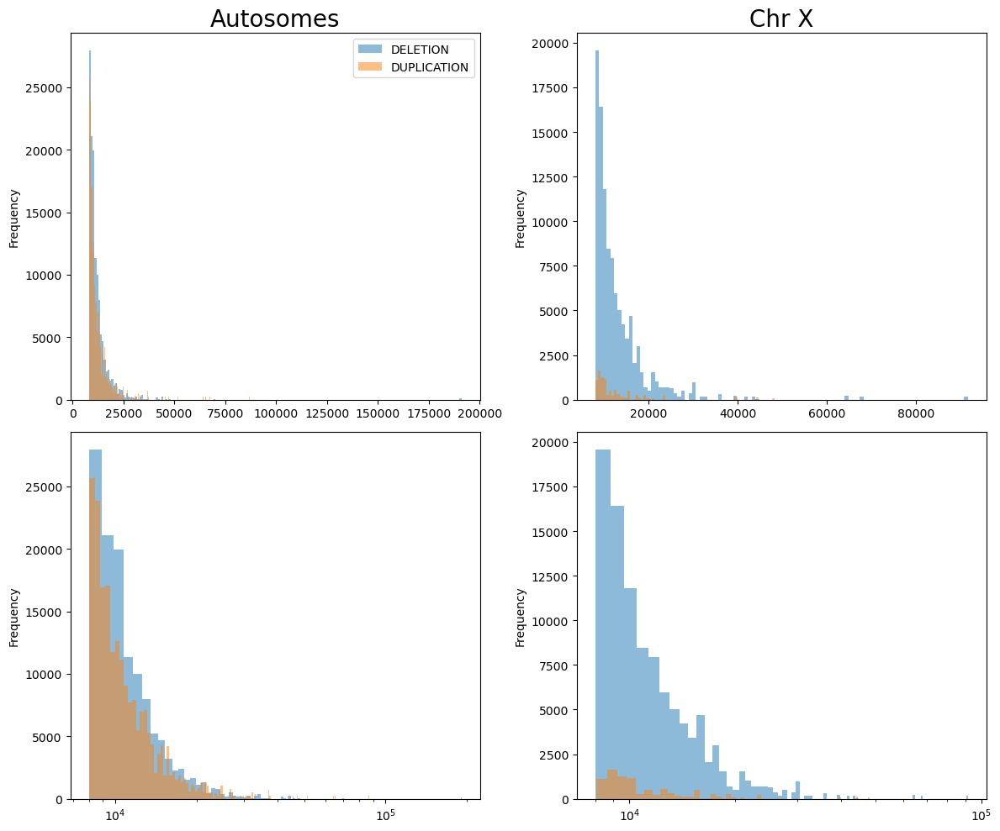

In [6]:
fig, axs = plt.subplots(2,2)
fig.set_size_inches(12, 10, forward=True)

axs[0, 0].set_title('Autosomes', size=20)

df1 = data_no_sex_chr.groupby(['TYPE'])['LENGHT']

df1.plot(kind='hist',stacked=True, bins=200, legend=True, ax=axs[0,0], xlabel='Size', alpha=0.5) # alpha for transparency
#plt.xlabel('Size')


df2 = data_no_sex_chr.groupby(['TYPE'])['LENGHT']

df2.plot(kind='hist',stacked=True, bins=200, logx=True, ax=axs[1,0], alpha=0.5) # alpha for transparency
#plt.xlabel('Size')


#fig.suptitle
axs[0, 1].set_title('Chr X', size=20)

df3 = data_x.groupby(['TYPE'])['LENGHT']

df3.plot(kind='hist',stacked=True, bins=100, ax=axs[0,1], alpha=0.5) # alpha for transparency

#plt.show()

df4 = data_x.groupby(['TYPE'])['LENGHT']

df4.plot(kind='hist',stacked=True, bins=100,logx=True, ax=axs[1,1], alpha=0.5) # alpha for transparency


fig.tight_layout() 
plt.savefig('../plots/distribution_chm13.png', transparent=True)
plt.show()

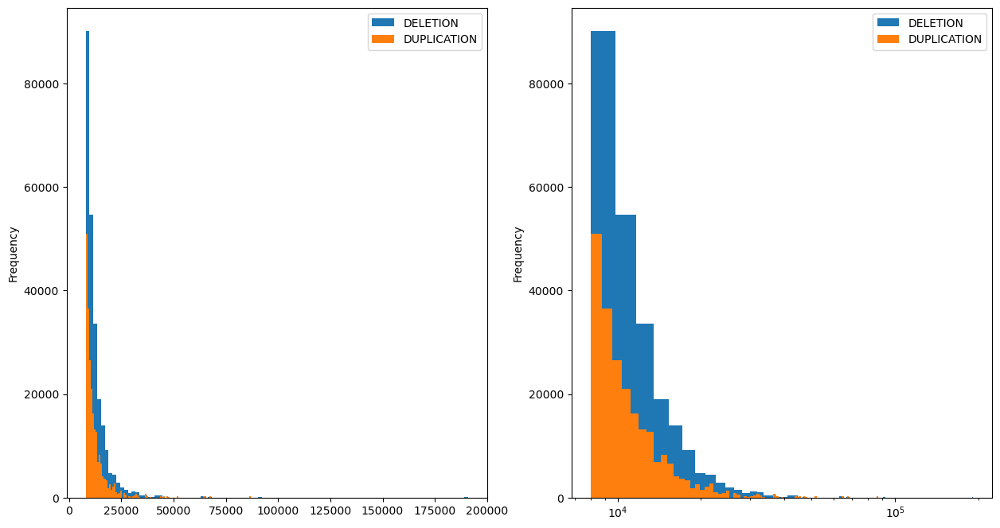

In [7]:
fig, axs = plt.subplots(1, 2, figsize=(15, 8))

df_plot= chm13.groupby(['TYPE'])['LENGHT']

df_plot.plot(kind='hist',stacked=True, bins=100, legend=True, ax=axs[0]) # alpha for transparency

plt.xscale('log')
#plt.show()

df_plot = chm13.groupby(['TYPE'])['LENGHT']

df_plot.plot(kind='hist',stacked=True, bins=100, legend=True, ax=axs[1]) # alpha for transparency

plt.show()

In [91]:
#subsetting deletions and duplications
deletions =data_no_sex_chr[data_no_sex_chr['TYPE'] =='DELETION']
duplications = chm13[chm13['TYPE'] == 'DUPLICATION']
deletions

biallelic_duplications = duplications[duplications['SCORE'] <5 ] 
biallelic_duplications


,SAMPLE,CHR,START,END,SCORE,TYPE,LENGHT
961235,LP6005441-DNA_B02,chrX,12119426,12128395,3,DUPLICATION,8969
961243,LP6005441-DNA_B02,chrX,36927247,36935767,3,DUPLICATION,8520
961244,LP6005441-DNA_B02,chrX,36983761,36991872,3,DUPLICATION,8111
961248,LP6005441-DNA_B02,chrX,37359626,37379401,3,DUPLICATION,19775
961263,LP6005441-DNA_B02,chrX,45920595,45935886,3,DUPLICATION,15291
...,...,...,...,...,...,...,...
1874406,LP6005442-DNA_H01,chr1,244109432,244120542,3,DUPLICATION,11110
1874409,LP6005442-DNA_H01,chr1,246431276,246439465,3,DUPLICATION,8189
1874427,LP6005442-DNA_H01,chr1,247629795,247637933,4,DUPLICATION,8138
1874432,LP6005442-DNA_H01,chr1,247954331,247967419,4,DUPLICATION,13088


In [9]:
#change to df when using telomeres and centromeres filtration
cnv = chm13.pivot_table(index=["CHR", "START", "END"], 
                    columns='SAMPLE', 
                    values='SCORE').reset_index()


cnv

SAMPLE,CHR,START,END,LP6005441-DNA_A01,LP6005441-DNA_A03,LP6005441-DNA_A04,LP6005441-DNA_A05,LP6005441-DNA_A06,LP6005441-DNA_A08,LP6005441-DNA_A09,...,LP6005677-DNA_D03,LP6005677-DNA_E01,LP6005677-DNA_F01,LP6005677-DNA_G01,LP6007068-DNA_A01,LP6007069-DNA_A01,SS6004471,SS6004477,SS6004478,SS6004480
0,chr1,102061,111943,12.0,15.0,11.0,14.0,15.0,12.0,11.0,...,15.0,13.0,14.0,14.0,14.0,12.0,15.0,11.0,13.0,16.0
1,chr1,521722,540598,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,1.0
2,chr1,613436,625116,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,chr1,839350,851555,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,1.0,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN
4,chr1,1041679,1050074,NaN,NaN,1.0,1.0,NaN,1.0,NaN,...,1.0,NaN,NaN,NaN,1.0,1.0,1.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10743,chrY,26436587,26458551,5.0,0.0,0.0,4.0,4.0,3.0,NaN,...,0.0,4.0,0.0,4.0,4.0,0.0,3.0,4.0,0.0,4.0
10744,chrY,26778516,26788355,4.0,0.0,0.0,3.0,3.0,4.0,NaN,...,0.0,3.0,0.0,4.0,4.0,0.0,3.0,3.0,0.0,4.0
10745,chrY,62325695,62345374,NaN,NaN,NaN,NaN,NaN,NaN,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10746,chrY,62345374,62363313,NaN,NaN,NaN,NaN,NaN,NaN,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [92]:
#change to df when using telomeres and centromeres filtration
final_cnv = deletions.pivot_table(index=["CHR", "START", "END"], 
                    columns='SAMPLE', 
                    values='SCORE').reset_index()


#final_cnv = final_cnv.dropna(thresh=100)
final_cnv

SAMPLE,CHR,START,END,LP6005441-DNA_A01,LP6005441-DNA_A03,LP6005441-DNA_A04,LP6005441-DNA_A05,LP6005441-DNA_A06,LP6005441-DNA_A08,LP6005441-DNA_A09,...,LP6005677-DNA_D03,LP6005677-DNA_E01,LP6005677-DNA_F01,LP6005677-DNA_G01,LP6007068-DNA_A01,LP6007069-DNA_A01,SS6004471,SS6004477,SS6004478,SS6004480
0,chr1,521722,540598,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,1.0
1,chr1,839350,851555,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,chr1,1041679,1050074,NaN,NaN,1.0,1.0,NaN,1.0,NaN,...,1.0,NaN,NaN,NaN,1.0,1.0,1.0,NaN,NaN,NaN
3,chr1,1199726,1209870,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,NaN,NaN
4,chr1,1382671,1391067,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7435,chr9,150183909,150197938,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7436,chr9,150225245,150233612,NaN,NaN,1.0,1.0,NaN,NaN,NaN,...,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0
7437,chr9,150255174,150267008,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7438,chr9,150294534,150308031,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN


In [93]:
from scipy import stats
#final_cnv = final_cnv.iloc[new]
final = final_cnv.iloc[:,3:284]
counts = final
counts = counts.fillna(2)

#counts = counts[counts.columns.intersection(counts_a.columns)]

#counts = counts.drop(columns=['LP6005592-DNA_G03',
#                     'LP6005443-DNA_E10',
#                     'LP6005442-DNA_E04'])

counts = counts.T
counts = counts.sort_index()
counts

,0,1,2,3,4,5,6,7,8,9,...,7430,7431,7432,7433,7434,7435,7436,7437,7438,7439
SAMPLE,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A01,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A03,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A04,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0
LP6005441-DNA_A05,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0
LP6005441-DNA_A06,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,1.0,1.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
SS6004471,1.0,2.0,1.0,1.0,2.0,2.0,2.0,2.0,1.0,1.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
SS6004477,2.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0,1.0,1.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0


In [94]:
features = ids_hg19.set_index('SAMPLE').merge(counts, left_index=True, right_index=True)
features = features.loc[:,['REGION', 'COUNTRY']]
features = features.sort_index()
features 

,REGION,COUNTRY
SAMPLE,,
LP6005441-DNA_A01,WestEurasia,Russia(Caucasus)
LP6005441-DNA_A03,Oceania,PapuaNewGuinea
LP6005441-DNA_A04,America,Colombia
LP6005441-DNA_A05,WestEurasia,France
LP6005441-DNA_A06,WestEurasia,Italy(Bergamo)
...,...,...
LP6007069-DNA_A01,WestEurasia,Greece
SS6004471,Africa,Congo
SS6004477,Oceania,Australia


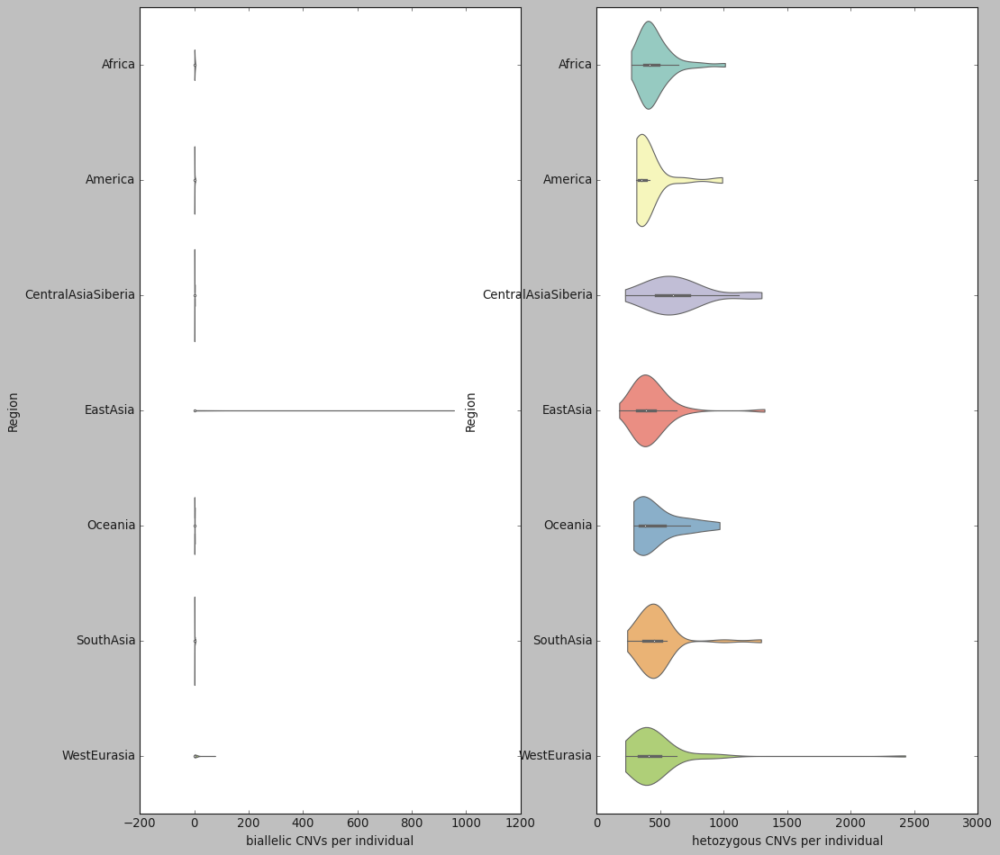

In [95]:
#import seaborn as sns

#pd.set_option("display.max_rows", None, "display.max_columns", None)
biallelic_deletions = deletions[deletions['SCORE'] == 0 ] 
biallelic_deletions = biallelic_deletions.groupby('SAMPLE').size()

biallelic_deletions = pd.DataFrame(biallelic_deletions)
#biallelic_deletions = biallelic_deletions.set_index('SAMPLE')

biallelic_deletions = features.merge(biallelic_deletions, left_index=True, right_index=True)
#biallelic_deletions = biallelic_deletions.reset_index()

#heterozygous_deletions.value_counts('SAMPLE').sort_index()
biallelic_deletions.columns = ['REGION', 'COUNTRY','TYPE']
biallelic_deletions


#pd.set_option("display.max_rows", None, "display.max_columns", None)
heterozygous_deletions = deletions[deletions['SCORE'] == 1] 
heterozygous_deletions = heterozygous_deletions.groupby('SAMPLE').size()
heterozygous_deletions = pd.DataFrame(heterozygous_deletions)
heterozygous_deletions = features.merge(heterozygous_deletions, left_index=True, right_index=True)
heterozygous_deletions.columns = ['REGION','COUNTRY', 'TYPE']
heterozygous_deletions
heterozygous_deletions


fig, axs = plt.subplots(1, 2, figsize=(15, 14))

ax = seaborn.violinplot(x="TYPE", y="REGION", data=biallelic_deletions, palette='Set3', order=[ "Africa","America", "CentralAsiaSiberia","EastAsia", "Oceania", "SouthAsia", "WestEurasia"], ax=axs[0], cut=0)

ax.set_xlabel("biallelic CNVs per individual")
ax.set_ylabel("Region")

ax = seaborn.violinplot(x="TYPE", y="REGION", data=heterozygous_deletions, palette='Set3', order=[ "Africa","America", "CentralAsiaSiberia","EastAsia", "Oceania", "SouthAsia", "WestEurasia"], ax=axs[1], cut=0)

ax.set_xlabel("hetozygous CNVs per individual")
ax.set_ylabel("Region")
plt.show()

In [96]:
#track features for pca & tsne
from sklearn import preprocessing

#X =preprocessing.scale(counts)

#PCA
pca = PCA(n_components=10)
pca_results = pca.fit_transform(counts)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2', 'component_3', 'component_4',
                                  'component_5',
                                  'component_6',
                                  'component_7',
                                  'component_8',
                                  'component_9',
                                   'component_10'
                                  ],
                          index=features.index)




df_pca = features.merge(df_pca, left_index=True, right_index=True)
df_pca

,REGION,COUNTRY,component_1,component_2,component_3,component_4,component_5,component_6,component_7,component_8,component_9,component_10
SAMPLE,,,,,,,,,,,,
LP6005441-DNA_A01,WestEurasia,Russia(Caucasus),-1.443814,0.137048,-0.333455,-0.884689,0.617969,-0.994706,-0.086554,0.236263,-0.985532,-0.370501
LP6005441-DNA_A03,Oceania,PapuaNewGuinea,1.495772,-1.044995,-0.220843,-0.653827,1.840512,-1.081820,-0.005020,1.846308,0.857717,-0.643240
LP6005441-DNA_A04,America,Colombia,-2.471690,0.314594,-0.485157,-0.553011,0.980694,-0.269643,0.374075,-0.110422,-0.742037,0.548604
LP6005441-DNA_A05,WestEurasia,France,-5.048411,0.872766,-0.561987,-0.529457,0.754662,1.746708,-0.142489,-2.048001,0.452839,-0.358312
LP6005441-DNA_A06,WestEurasia,Italy(Bergamo),-4.846266,0.995905,-1.117101,-0.184550,0.412934,0.692559,-0.197394,-0.680727,-0.171982,-0.334171
...,...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,WestEurasia,Greece,6.279942,-1.935474,3.020475,14.681303,-2.414796,2.687235,-1.197077,-2.283647,-0.146745,0.134680
SS6004471,Africa,Congo,5.570961,-0.371123,3.729564,16.841184,3.619756,1.348995,2.001804,3.189865,2.638070,0.247206
SS6004477,Oceania,Australia,7.337897,-0.838286,2.809226,13.482847,2.638470,-0.586396,0.798269,4.746704,-0.797999,0.855439


In [97]:
pca.explained_variance_ratio_

array([0.06680127, 0.04310725, 0.03509202, 0.01841035, 0.01245591,
       0.01008299, 0.00931909, 0.00874606, 0.00795565, 0.00726887])

                      COUNTRY  component_1  component_2  component_3  \
REGION                                                                 
WestEurasia  Russia(Caucasus)    -1.443814     0.137048    -0.333455   
Oceania        PapuaNewGuinea     1.495772    -1.044995    -0.220843   
America              Colombia    -2.471690     0.314594    -0.485157   
WestEurasia            France    -5.048411     0.872766    -0.561987   
WestEurasia    Italy(Bergamo)    -4.846266     0.995905    -1.117101   
...                       ...          ...          ...          ...   
WestEurasia            Greece     6.279942    -1.935474     3.020475   
Africa                  Congo     5.570961    -0.371123     3.729564   
Oceania             Australia     7.337897    -0.838286     2.809226   
Oceania             Australia     5.955907    -1.350537     2.414380   
Africa                  Sudan     1.724556    -0.985871     1.714550   

             component_4  component_5  component_6  component_7

/data/jbazanwilliamson/cnv_sgdp/scripts/pca_plot.py:50: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  figure = matplotlib.pyplot.figure(


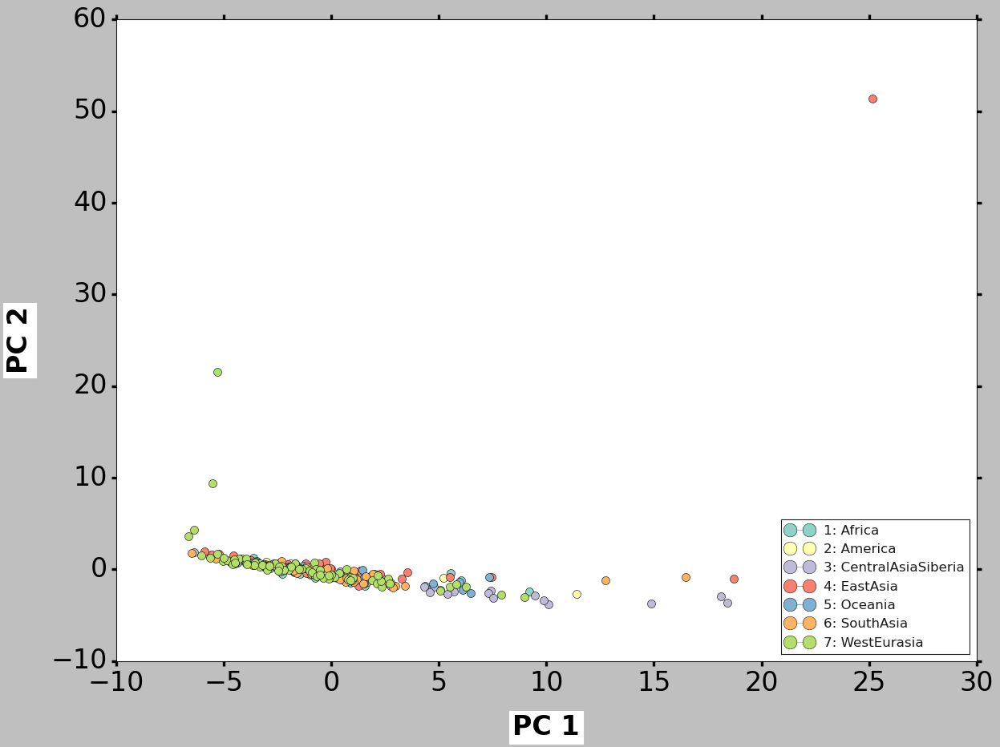

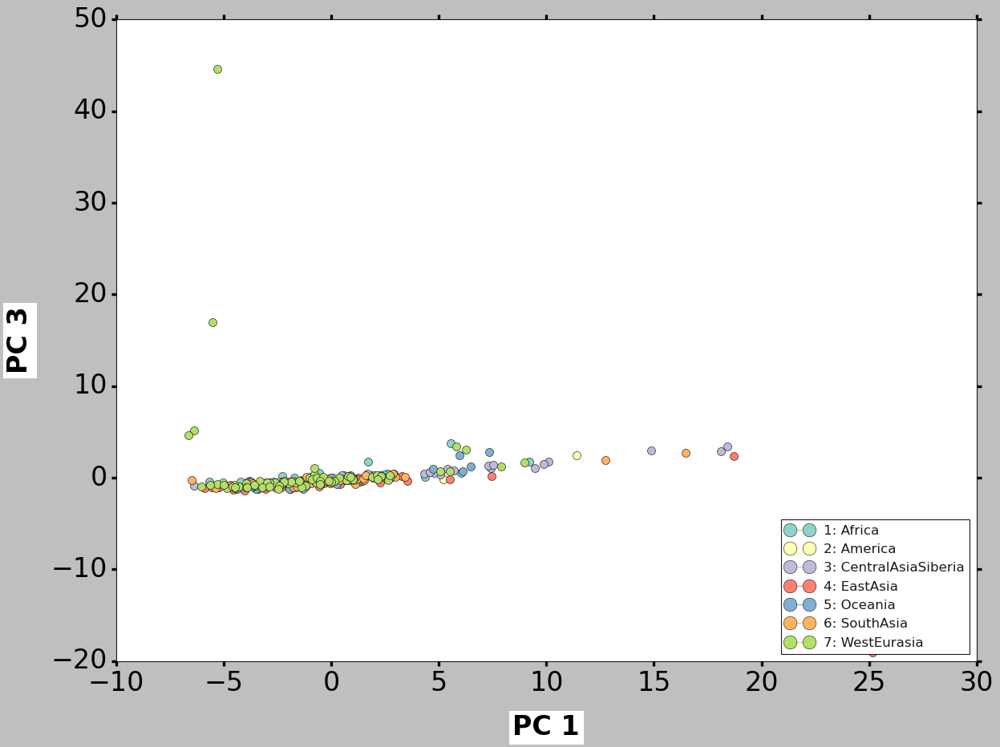

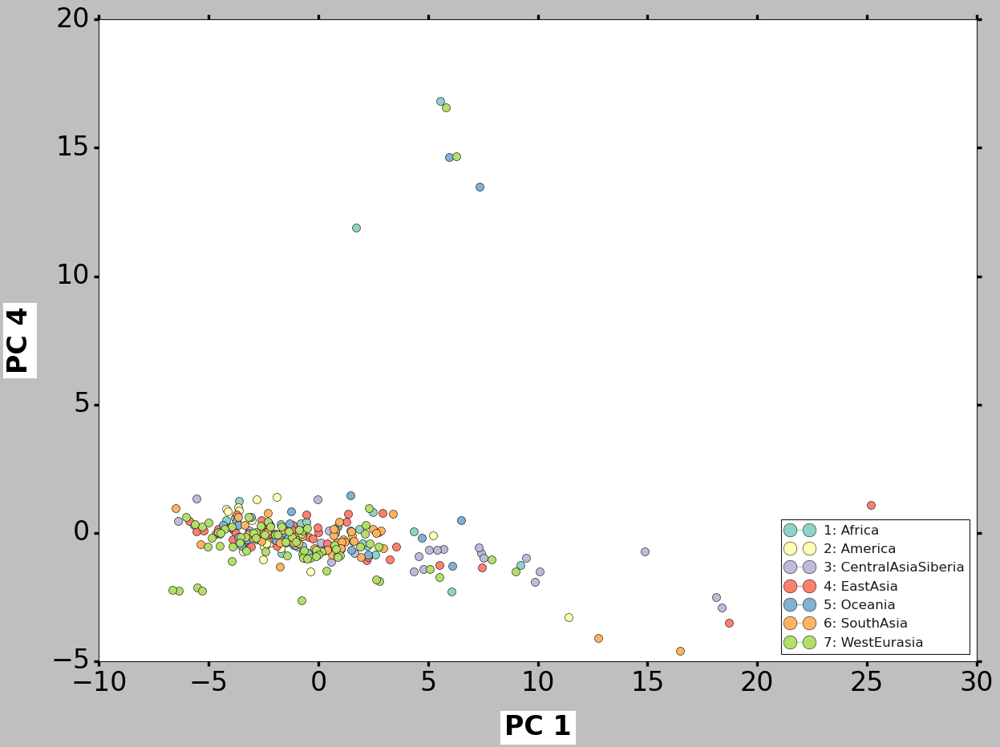

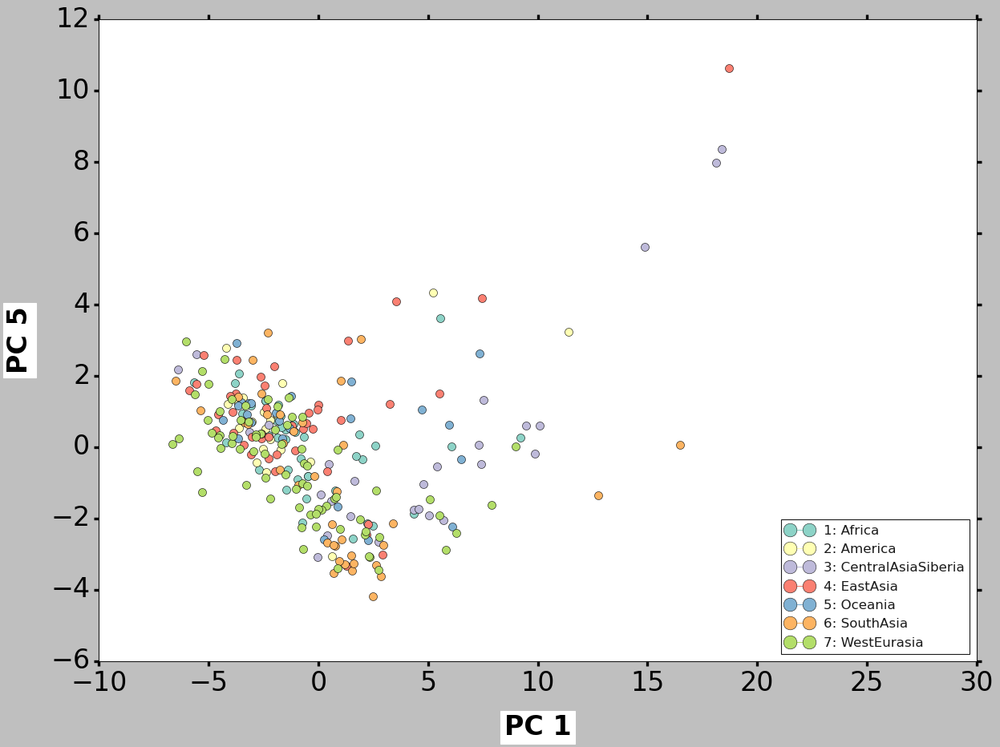

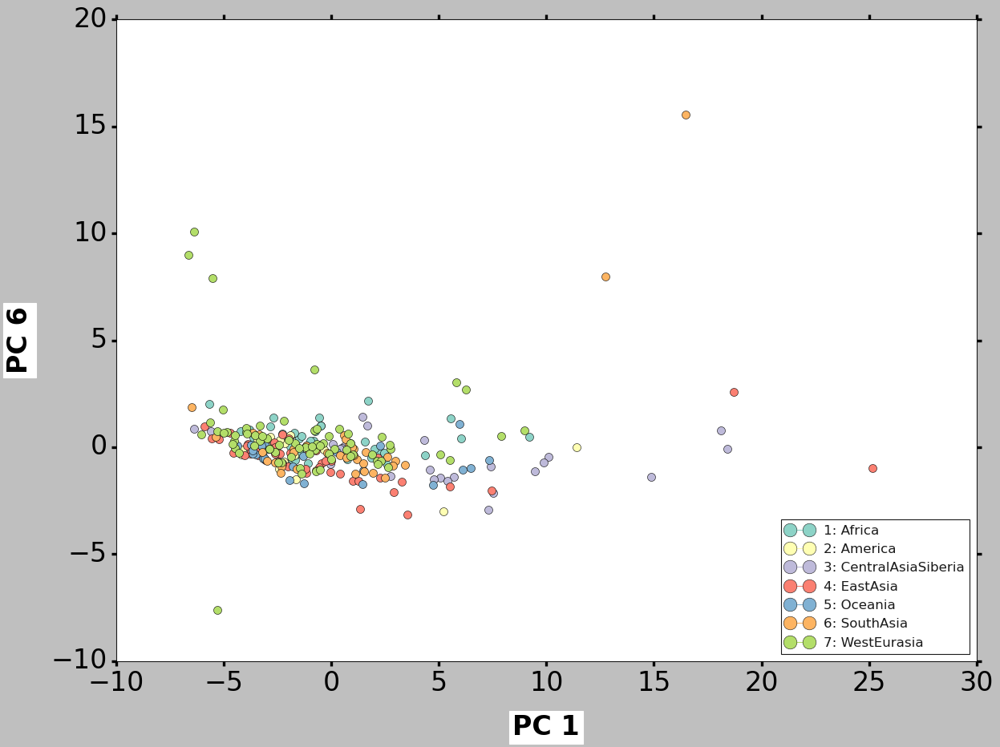

...

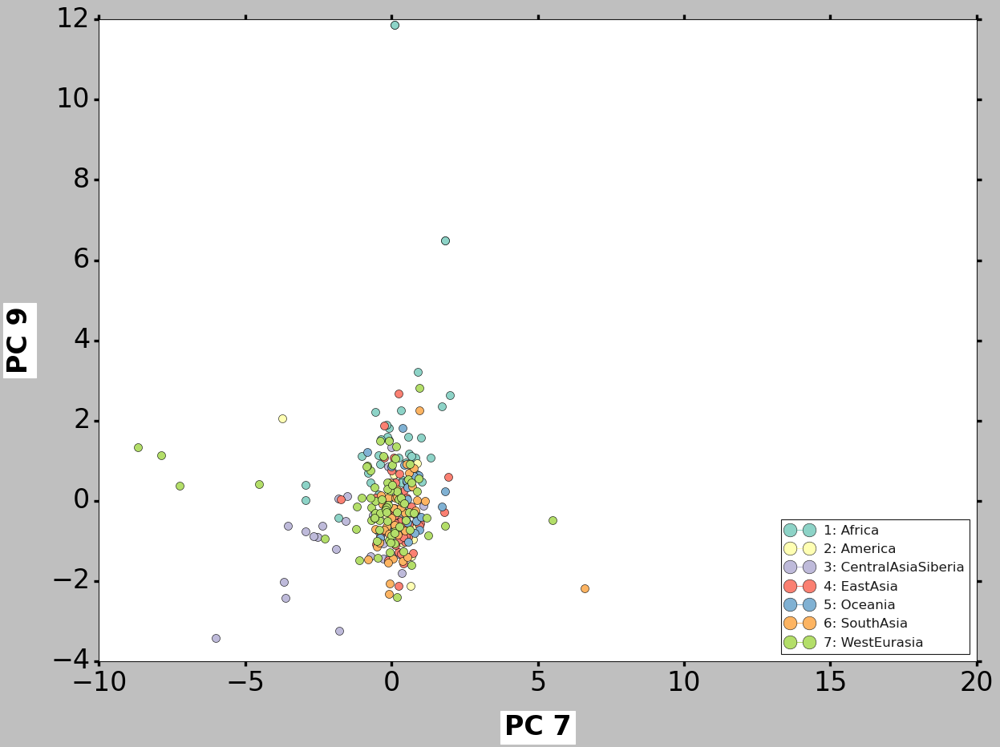

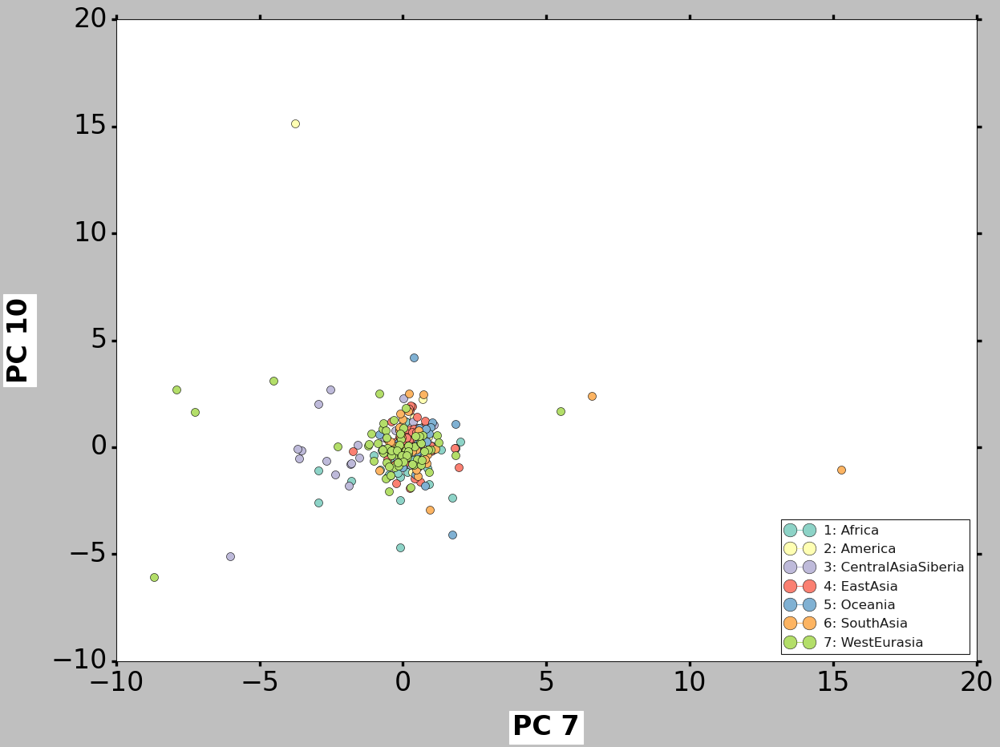

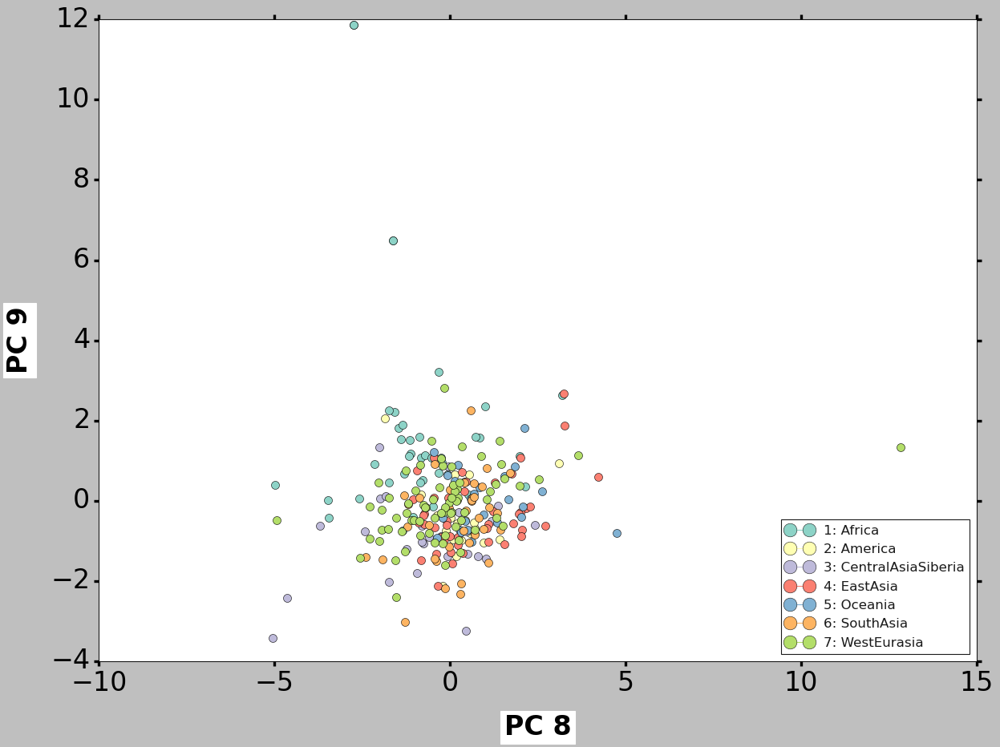

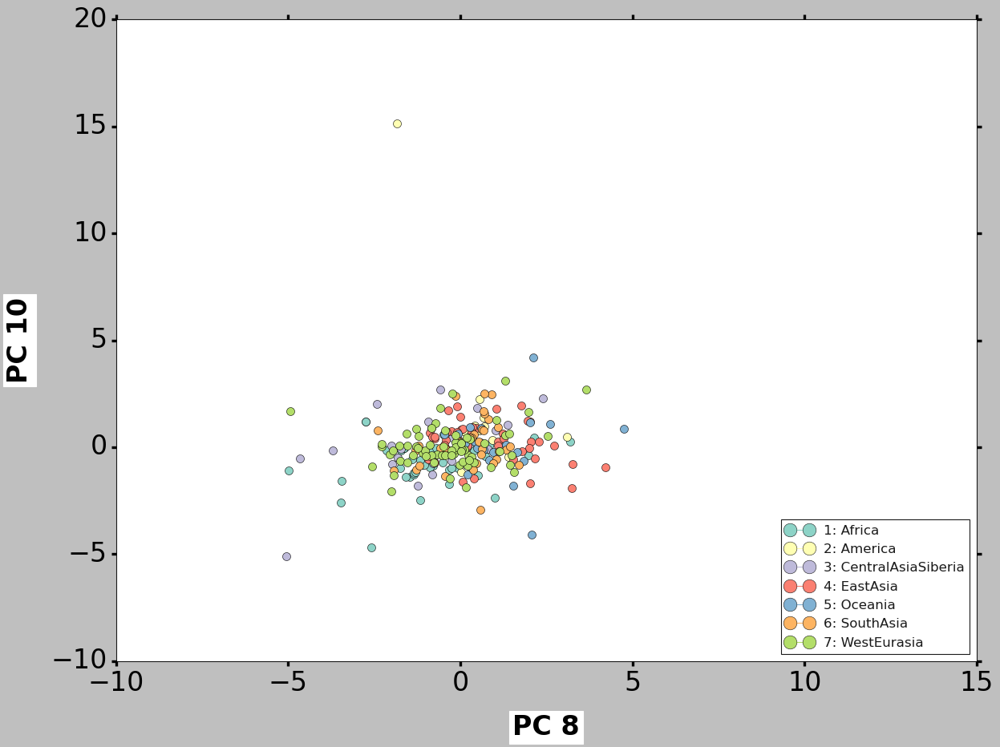

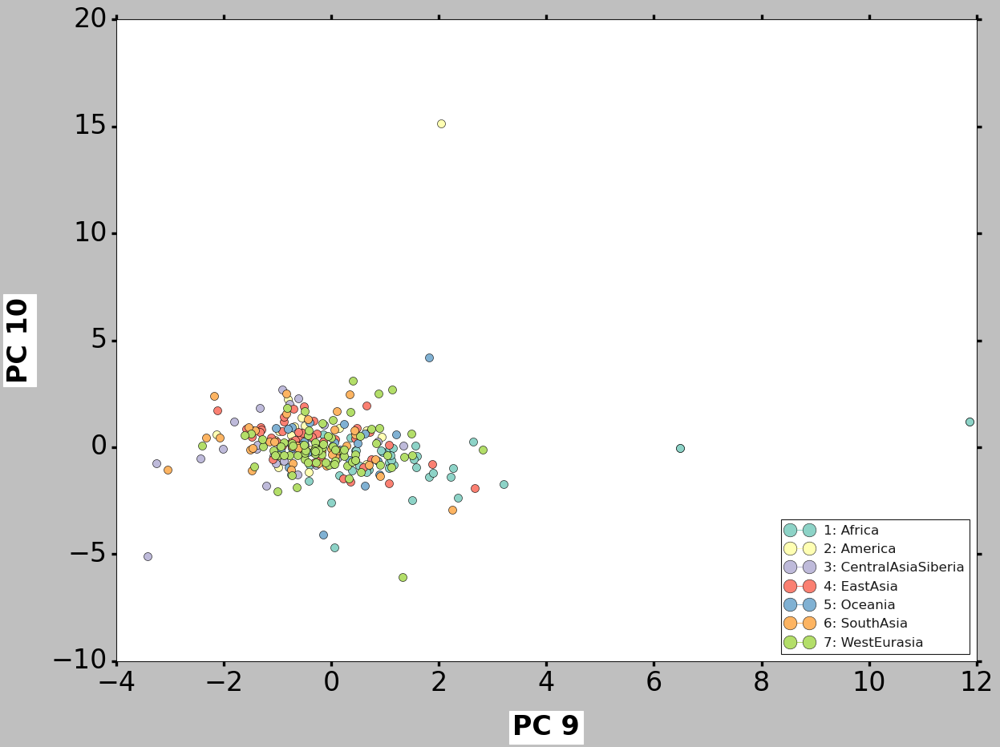

In [98]:
components = [1,2,3,4,5,6,7,8,9,10]

combinations_components = list(combinations(components,2))
for i in combinations_components:
    plot_scatter_cluster(data=df_pca, abscissa='component_'+str(i[0]), ordinate='component_'+str(i[1]), label_horizontal='PC '+ str(i[0]), label_vertical='PC '+str(i[1]), factor='REGION', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))
#    plot_scatter_cluster(data=df_pca, abscissa='component_8', ordinate='component_9', label_horizontal='Component 1', label_vertical='Component 3', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    

                      COUNTRY  component_1  component_2  component_3  \
REGION                                                                 
WestEurasia  Russia(Caucasus)    -1.443814     0.137048    -0.333455   
Oceania        PapuaNewGuinea     1.495772    -1.044995    -0.220843   
America              Colombia    -2.471690     0.314594    -0.485157   
WestEurasia            France    -5.048411     0.872766    -0.561987   
WestEurasia    Italy(Bergamo)    -4.846266     0.995905    -1.117101   
...                       ...          ...          ...          ...   
WestEurasia            Greece     6.279942    -1.935474     3.020475   
Africa                  Congo     5.570961    -0.371123     3.729564   
Oceania             Australia     7.337897    -0.838286     2.809226   
Oceania             Australia     5.955907    -1.350537     2.414380   
Africa                  Sudan     1.724556    -0.985871     1.714550   

             component_4  component_5  component_6  component_7

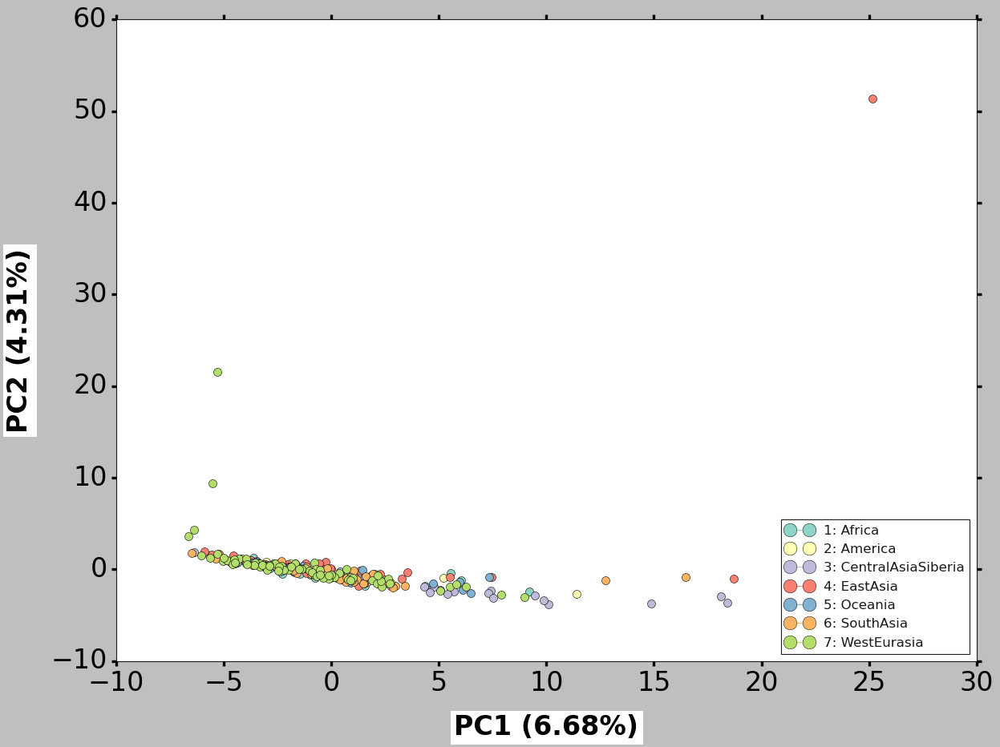

In [99]:
plt.style.use('classic')
plot_scatter_cluster(data=df_pca, abscissa='component_1', ordinate='component_2', label_horizontal='PC1 (6.68%)', label_vertical='PC2 (4.31%)', factor='REGION', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))
#    plot_scatter_cluster(data=df_pca, abscissa='component_8', ordinate='component_9', label_horizontal='Component 1', label_vertical='Component 3', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.savefig('../plots/pca_chm13_deletions.png', transparent=True)

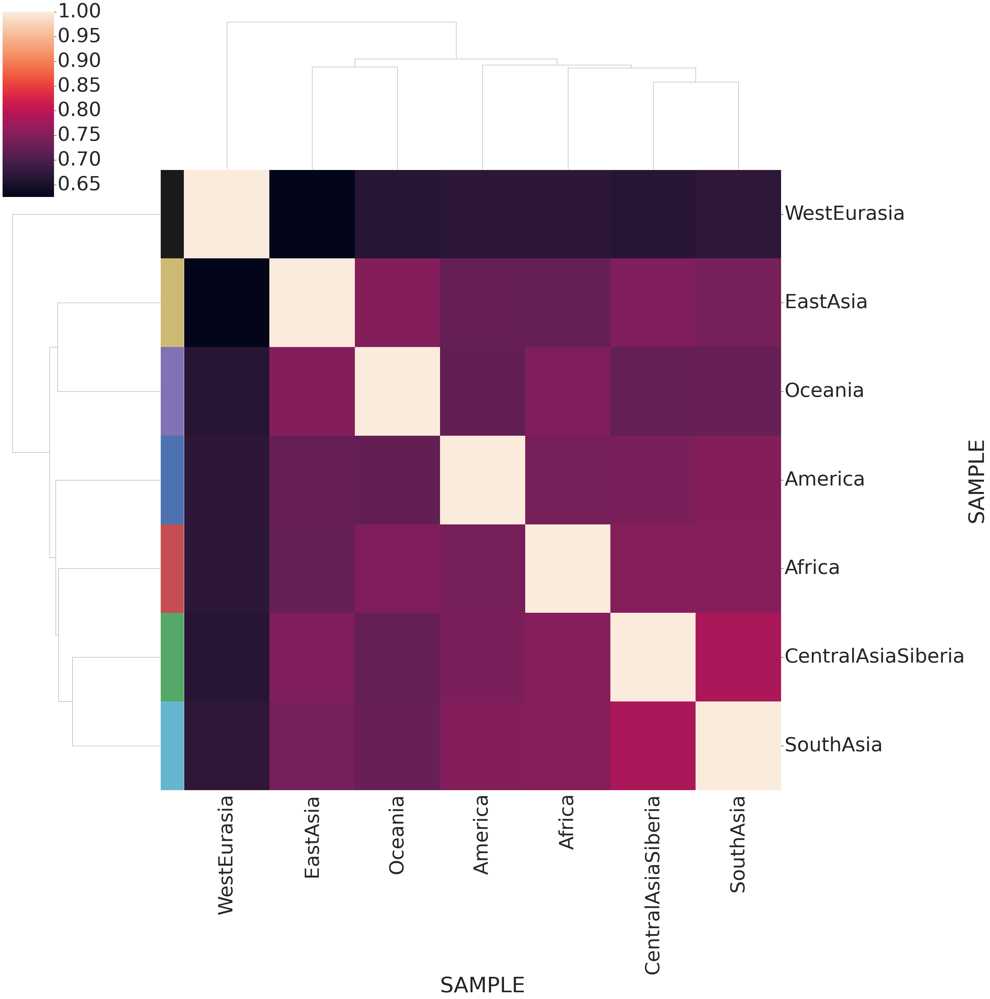

In [19]:
freq = final_cnv.iloc[:,3:283]
freq_input = freq.rename(columns=features['REGION'])
df = freq_input.T
#df = df.reset_index()

#df.groupby('SAMPLE').count().div(df.groupby('SAMPLE').size(),0)


df = df.notnull().groupby(level=0).mean()

df = df.T

lut = dict(zip(df.columns.unique(), "rbgymck"))
lut

seaborn.set(font_scale=5)
corrmatrix = df.corr(method='spearman')
row_colors = df.columns.map(lut)
seaborn.clustermap(corrmatrix, row_colors=row_colors, row_cluster=True, figsize=(40,40))
#plt.savefig('clustermap_regions.pdf')

In [20]:
feature_table = pd.read_table('../data/GCF_009914755.1_T2T-CHM13v2.0_feature_table.txt')#, index_col='chromosome')
report = pd.read_table('../data/GCF_009914755.1_T2T-CHM13v2.0_assembly_report.txt')

/opt/spack/opt/spack/linux-rhel8-icelake/gcc-8.4.1/anaconda3-2021.05-fmo625scqdt32etnaksoexe3rd6sea7j/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3460: DtypeWarning: Columns (5) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [21]:
chm13_gene_anotation = feature_table.merge(report, left_on='genomic_accession', right_on='RefSeq-Accn')
chm13_gene_anotation[chm13_gene_anotation['class'] == 'protein_coding']
chm13_gene_anotation


,# feature,class,assembly,assembly_unit,seq_type,chromosome,genomic_accession,start,end,strand,...,Sequence-Name,Sequence-Role,Assigned-Molecule,Assigned-Molecule-Location/Type,GenBank-Accn,Relationship,RefSeq-Accn,Assembly-Unit,Sequence-Length,UCSC-style-name
0,gene,protein_coding,GCF_009914755.1,Primary Assembly,chromosome,1,NC_060925.1,11134,37628,-,...,1,assembled-molecule,1,Chromosome,CP068277.2,=,NC_060925.1,Primary Assembly,248387328,na
1,mRNA,NaN,GCF_009914755.1,Primary Assembly,chromosome,1,NC_060925.1,11134,37628,-,...,1,assembled-molecule,1,Chromosome,CP068277.2,=,NC_060925.1,Primary Assembly,248387328,na
2,CDS,with_protein,GCF_009914755.1,Primary Assembly,chromosome,1,NC_060925.1,13463,37628,-,...,1,assembled-molecule,1,Chromosome,CP068277.2,=,NC_060925.1,Primary Assembly,248387328,na
3,gene,lncRNA,GCF_009914755.1,Primary Assembly,chromosome,1,NC_060925.1,20892,23710,-,...,1,assembled-molecule,1,Chromosome,CP068277.2,=,NC_060925.1,Primary Assembly,248387328,na
4,ncRNA,lncRNA,GCF_009914755.1,Primary Assembly,chromosome,1,NC_060925.1,20892,23710,-,...,1,assembled-molecule,1,Chromosome,CP068277.2,=,NC_060925.1,Primary Assembly,248387328,na
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
236307,gene,protein_coding,GCF_009914755.1,Primary Assembly,chromosome,Y,NC_060948.1,62446549,62449392,+,...,Y,assembled-molecule,Y,Chromosome,CP086569.2,=,NC_060948.1,Primary Assembly,62460029,na
236308,mRNA,NaN,GCF_009914755.1,Primary Assembly,chromosome,Y,NC_060948.1,62446549,62449392,+,...,Y,assembled-molecule,Y,Chromosome,CP086569.2,=,NC_060948.1,Primary Assembly,62460029,na
236309,CDS,with_protein,GCF_009914755.1,Primary Assembly,chromosome,Y,NC_060948.1,62446549,62449100,+,...,Y,assembled-molecule,Y,Chromosome,CP086569.2,=,NC_060948.1,Primary Assembly,62460029,na
236310,gene,transcribed_pseudogene,GCF_009914755.1,Primary Assembly,chromosome,Y,NC_060948.1,62449384,62451910,-,...,Y,assembled-molecule,Y,Chromosome,CP086569.2,=,NC_060948.1,Primary Assembly,62460029,na


<h1> Phylo

In [100]:
from Bio.Phylo.TreeConstruction import _Matrix
from Bio.Phylo.TreeConstruction import DistanceMatrix
from scipy.spatial.distance import pdist, squareform
import scipy.stats

a = scipy.stats.zscore(counts, axis=1)
distances = pdist(np.array(a), metric='euclidean')
dist_matrix = squareform(distances)
dist_matrix.shape

dist_matrix

name =  list(counts.index)
matrix = dist_matrix
dist_matrix

array([[  0.        ,  96.89063893,  96.55651571, ..., 100.50869399,
        102.50255926, 104.39974369],
       [ 96.89063893,   0.        ,  95.86550548, ...,  98.97166458,
        100.61316597, 104.29050962],
       [ 96.55651571,  95.86550548,   0.        , ..., 102.73980552,
        102.11184038, 105.04967291],
       ...,
       [100.50869399,  98.97166458, 102.73980552, ...,   0.        ,
         86.53511859,  93.08621507],
       [102.50255926, 100.61316597, 102.11184038, ...,  86.53511859,
          0.        ,  90.33165732],
       [104.39974369, 104.29050962, 105.04967291, ...,  93.08621507,
         90.33165732,   0.        ]])

In [101]:
lut = dict(zip(features['REGION'].unique(), "rbgymck"))

row_colors = features['REGION'].map(lut)
row_color = row_colors.to_dict()
lut

features

,REGION,COUNTRY
SAMPLE,,
LP6005441-DNA_A01,WestEurasia,Russia(Caucasus)
LP6005441-DNA_A03,Oceania,PapuaNewGuinea
LP6005441-DNA_A04,America,Colombia
LP6005441-DNA_A05,WestEurasia,France
LP6005441-DNA_A06,WestEurasia,Italy(Bergamo)
...,...,...
LP6007069-DNA_A01,WestEurasia,Greece
SS6004471,Africa,Congo
SS6004477,Oceania,Australia


In [102]:
from biotite.sequence.phylo import neighbor_joining
#track features for pca & tsne
#features = features.sort_index()

#names.get_indices()
labels = list(counts.index)
#labels = list(features['10-Region'])
tree = biotite.sequence.phylo.neighbor_joining(dist_matrix)
t = print(tree.to_newick(labels=labels, include_distance=True))


#with open('newick_tree.tree', 'a') as f:
#    f.write(t)


((((((((LP6005677-DNA_E01:46.194732666015625,LP6005443-DNA_C07:45.723480224609375):0.9044163227081299,(LP6005443-DNA_G01:45.72200393676758,LP6005443-DNA_B07:46.050968170166016):1.5173861980438232):0.11287937313318253,(LP6005443-DNA_F01:45.90475845336914,LP6005441-DNA_F09:46.56496810913086):1.0421823263168335):0.2646827697753906,(LP6005443-DNA_E07:44.7030143737793,LP6005441-DNA_B05:47.03042221069336):0.9659185409545898):0.3582175374031067,((LP6005441-DNA_H12:47.91288375854492,LP6005441-DNA_G06:46.2773551940918):0.21844933927059174,(LP6005441-DNA_D07:45.858673095703125,LP6005441-DNA_C03:48.23528289794922):0.8131363391876221):0.36242884397506714):0.19881245493888855,((((LP6005592-DNA_G01:45.82413101196289,LP6005441-DNA_C09:46.12510299682617):0.5862827301025391,(((LP6005592-DNA_D03:45.2372932434082,LP6005441-DNA_E10:45.78836441040039):0.45333364605903625,LP6005443-DNA_C02:46.41712951660156):0.634305477142334,(((LP6005443-DNA_D01:47.84109878540039,LP6005441-DNA_A06:43.417850494384766):0.806

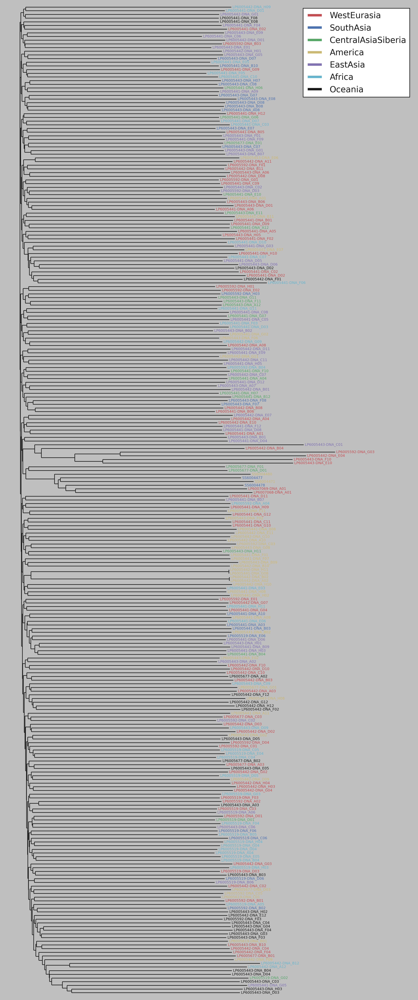

In [103]:
from Bio import Phylo
from io import StringIO 
import pylab
from matplotlib.lines import Line2D

handle = StringIO(str(tree.to_newick(labels=labels, include_distance=True)))
tree_2 = Phylo.read(handle, "newick")
tree_2.ladderize()

matplotlib.rc('font', size=6)
    # set the size of the figure
fig = plt.figure(figsize=(10, 70), dpi=300)
    # alternatively
    # fig.set_size_inches(10, 40)
axes = fig.add_subplot(3, 1, 1)
fig.tight_layout()
Phylo.draw(tree_2, 
           axes=axes, 
           do_show=False,
           label_colors= row_color)
pylab.axis('off')

### CUSTOM LEGEND
custom_lines = [Line2D([0], [0], color='r', lw=4),
                Line2D([0], [0], color='b', lw=4),
                Line2D([0], [0], color='g', lw=4),
                Line2D([0], [0], color='y', lw=4),
                Line2D([0], [0], color='m', lw=4),
                Line2D([0], [0], color='c', lw=4),
                Line2D([0], [0], color='k', lw=4)]

#fig, ax = plt.subplots()
plt.legend(custom_lines, ['WestEurasia', 'SouthAsia', 'CentralAsiaSiberia', 'America', 'EastAsia', 'Africa','Oceania'],  loc =0, prop={'size': 14})

#plt.savefig('neighbor-joining-tree_euclidean.png')

In [104]:
from biotite.sequence.phylo import upgma

#features = features.sort_index()

#names.get_indices()
labels = list(counts.index)
#labels = list(features['10-Region'])
tree = biotite.sequence.phylo.upgma(dist_matrix)
t = print(tree.to_newick(labels=labels, include_distance=True))



(((((((SS6004480:45.911094665527344,((SS6004478:42.91612243652344,(LP6007069-DNA_A01:41.338050842285156,LP6007068-DNA_A01:41.338050842285156):1.5780715942382812):2.1963577270507812,(SS6004477:44.32102966308594,SS6004471:44.32102966308594):0.7914505004882812):0.798614501953125):5.208610534667969,((((((((((LP6005677-DNA_G01:48.90259552001953,LP6005442-DNA_A03:48.90259552001953):0.7865409851074219,(((((((((((((((((((((LP6005677-DNA_F01:46.87084197998047,LP6005677-DNA_D01:46.87084197998047):1.2619895935058594,((((((((((((((((LP6005677-DNA_E01:45.9591064453125,LP6005443-DNA_C07:45.9591064453125):1.0134773254394531,(((((((((LP6005592-DNA_H03:45.15251922607422,LP6005443-DNA_G11:45.15251922607422):0.88885498046875,((LP6005592-DNA_E01:45.53806686401367,(LP6005443-DNA_E07:45.39104461669922,((((LP6005443-DNA_E01:43.95583724975586,((LP6005441-DNA_F05:42.29179382324219,LP6005441-DNA_C06:42.29179382324219):0.394287109375,LP6005441-DNA_E05:42.68608093261719):1.2697563171386719):0.4701728820800781,LP6

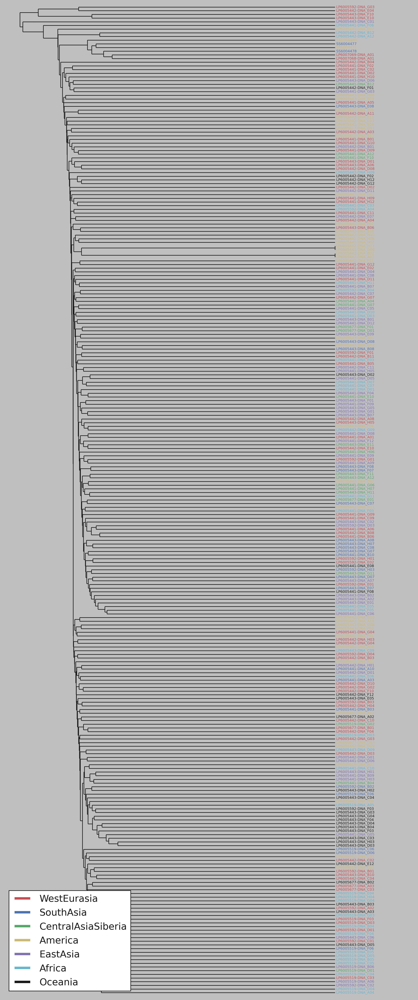

In [105]:
from Bio import Phylo
from io import StringIO 
from matplotlib.lines import Line2D
import pylab

handle = StringIO(str(tree.to_newick(labels=labels, include_distance=True)))
tree_2 = Phylo.read(handle, "newick")
tree_2.ladderize()

matplotlib.rc('font', size=6)
#matplotlib.rc('font', size=6)
    # set the size of the figure
#fig = plt.figure(figsize=(20, 80), dpi=300)
fig = plt.figure(figsize=(10, 70), dpi=300)
    # alternatively
    # fig.set_size_inches(10, 40)
axes = fig.add_subplot(3, 1, 1)
fig.tight_layout()
Phylo.draw(tree_2, 
           axes=axes, 
           do_show=False,
           label_colors= row_color)
pylab.axis('off')

### CUSTOM LEGEND
custom_lines = [Line2D([0], [0], color='r', lw=4),
                Line2D([0], [0], color='b', lw=4),
                Line2D([0], [0], color='g', lw=4),
                Line2D([0], [0], color='y', lw=4),
                Line2D([0], [0], color='m', lw=4),
                Line2D([0], [0], color='c', lw=4),
                Line2D([0], [0], color='k', lw=4)]

#fig, ax = plt.subplots()
plt.legend(custom_lines, ['WestEurasia', 'SouthAsia', 'CentralAsiaSiberia', 'America', 'EastAsia', 'Africa','Oceania'],  loc =3, prop={'size': 16})

#plt.savefig('upgma-tree_euclidean.png')
#plt.legend(row_color, loc ="upper left")
#plt.savefig('upgma-tree.pdf')
#Phylo.write(tree_2, "egfr-family-annotated.xml", "phyloxml")

In [106]:
deletions

,SAMPLE,CHR,START,END,SCORE,TYPE,LENGHT
165,LP6005441-DNA_B02,chr22,18805936,18816025,1,DELETION,10089
166,LP6005441-DNA_B02,chr22,25035009,25045165,1,DELETION,10156
170,LP6005441-DNA_B02,chr22,25234701,25242766,1,DELETION,8065
176,LP6005441-DNA_B02,chr22,32151736,32167381,1,DELETION,15645
178,LP6005441-DNA_B02,chr22,33010661,33020973,1,DELETION,10312
...,...,...,...,...,...,...,...
960926,LP6005442-DNA_H01,chr1,219286241,219296859,1,DELETION,10618
960934,LP6005442-DNA_H01,chr1,234771814,234789536,1,DELETION,17722
960953,LP6005442-DNA_H01,chr1,234802106,234810374,1,DELETION,8268
960971,LP6005442-DNA_H01,chr1,239472008,239480284,1,DELETION,8276


<h1> Vst

In [107]:
#change to df when using telomeres and centromeres filtration
input_vst = deletions.pivot_table(index=["CHR", "START", "END"], 
                    columns='SAMPLE', 
                    values='SCORE').reset_index()


#input_vst = input_vst[input_vst['CHR'] != 'chrY']
#input_vst = input_vst[input_vst['CHR'] != 'chrX']
input_vst

SAMPLE,CHR,START,END,LP6005441-DNA_A01,LP6005441-DNA_A03,LP6005441-DNA_A04,LP6005441-DNA_A05,LP6005441-DNA_A06,LP6005441-DNA_A08,LP6005441-DNA_A09,...,LP6005677-DNA_D03,LP6005677-DNA_E01,LP6005677-DNA_F01,LP6005677-DNA_G01,LP6007068-DNA_A01,LP6007069-DNA_A01,SS6004471,SS6004477,SS6004478,SS6004480
0,chr1,521722,540598,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,1.0
1,chr1,839350,851555,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,chr1,1041679,1050074,NaN,NaN,1.0,1.0,NaN,1.0,NaN,...,1.0,NaN,NaN,NaN,1.0,1.0,1.0,NaN,NaN,NaN
3,chr1,1199726,1209870,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,NaN,NaN
4,chr1,1382671,1391067,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7435,chr9,150183909,150197938,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7436,chr9,150225245,150233612,NaN,NaN,1.0,1.0,NaN,NaN,NaN,...,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0
7437,chr9,150255174,150267008,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7438,chr9,150294534,150308031,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN


In [108]:
coordinates = input_vst.iloc[:,0:2]
cnvs = input_vst.iloc[:,3:284]
cnvs = cnvs.T
cnvs = cnvs.fillna(2)
cnvs

,0,1,2,3,4,5,6,7,8,9,...,7430,7431,7432,7433,7434,7435,7436,7437,7438,7439
SAMPLE,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A01,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A03,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A04,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0
LP6005441-DNA_A05,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0
LP6005441-DNA_A06,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,1.0,1.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
SS6004471,1.0,2.0,1.0,1.0,2.0,2.0,2.0,2.0,1.0,1.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
SS6004477,2.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0,1.0,1.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0


In [109]:
dt = features.merge(cnvs, left_index=True, right_index=True)
dt

,REGION,COUNTRY,0,1,2,3,4,5,6,7,...,7430,7431,7432,7433,7434,7435,7436,7437,7438,7439
SAMPLE,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A01,WestEurasia,Russia(Caucasus),2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A03,Oceania,PapuaNewGuinea,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A04,America,Colombia,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0
LP6005441-DNA_A05,WestEurasia,France,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0
LP6005441-DNA_A06,WestEurasia,Italy(Bergamo),2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,WestEurasia,Greece,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
SS6004471,Africa,Congo,1.0,2.0,1.0,1.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
SS6004477,Oceania,Australia,2.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0


In [110]:
####### Groupby regions #######
dt_group = dt.groupby('REGION')

dt_groupped = []
regions = features['REGION'].unique()
print(regions)
for i in regions:
    dt_groupped.append(dt_group.get_group(str(i)))
    

#### Names to pair-population
regions = dt['REGION'].unique()
print(regions)
combination_names = []
for i in list(combinations(regions,2)):
    combination_names.append(i[0]+str('-')+i[1])

['WestEurasia' 'Oceania' 'America' 'Africa' 'EastAsia' 'SouthAsia'
 'CentralAsiaSiberia']
['WestEurasia' 'Oceania' 'America' 'Africa' 'EastAsia' 'SouthAsia'
 'CentralAsiaSiberia']


In [111]:
## VST for pair-population

from vst_function import *
vst_dt = []

combination_regions = list(combinations([0,1,2,3,4,5,6],2))
for region in combination_regions:
        statistic = vst((dt_groupped[region[0]]), (dt_groupped[region[1]]))
        vst_dt.append(statistic)

vst_dt = pd.DataFrame(vst_dt).set_axis(combination_names)
#vst_dt = vst_dt.T
vst_dt

/opt/spack/opt/spack/linux-rhel8-icelake/gcc-8.4.1/anaconda3-2021.05-fmo625scqdt32etnaksoexe3rd6sea7j/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3700: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return var(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/data/jbazanwilliamson/cnv_sgdp/scripts/vst_function.py:33: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  vt = pd.concat([x,y]).var()


,0,1,2,3,4,5,6,7,8,9,...,7430,7431,7432,7433,7434,7435,7436,7437,7438,7439
WestEurasia-Oceania,0.051059,0.017159,0.032919,0.016361,0.026963,NaN,NaN,0.010959,0.010593,0.024893,...,0.010311,0.041667,0.017448,0.020694,NaN,0.013699,0.024411,NaN,0.040124,0.013699
WestEurasia-America,0.011290,0.032138,0.011314,0.018279,0.015938,NaN,NaN,0.022934,0.029389,0.016709,...,0.011074,NaN,0.013699,0.022142,NaN,0.013699,0.020572,NaN,0.013699,0.013699
WestEurasia-Africa,0.026284,0.031311,0.009836,0.011288,0.012066,NaN,0.040287,0.008938,0.008989,0.011855,...,0.010654,0.040287,0.019737,0.013482,NaN,0.013699,0.048474,NaN,0.019737,0.010286
WestEurasia-EastAsia,0.008431,0.019084,0.016229,0.009532,0.008846,NaN,0.021739,0.018175,0.018227,0.010275,...,0.008437,NaN,0.016889,0.035248,0.021739,0.013699,0.010048,0.021739,0.009323,0.009323
WestEurasia-SouthAsia,0.009650,0.013099,0.031034,0.033256,0.009065,0.043940,0.026316,0.017507,0.051757,0.018474,...,0.009699,NaN,0.013699,0.010412,NaN,0.013699,0.015748,NaN,0.013699,0.013699
WestEurasia-CentralAsiaSiberia,0.026437,0.021071,0.026242,0.026437,0.011155,NaN,NaN,0.019506,0.016455,0.017473,...,0.014468,NaN,0.084259,0.026960,0.064626,0.015423,0.031691,NaN,0.013699,0.015423
Oceania-America,0.058375,0.078571,0.068333,0.059375,0.083034,NaN,NaN,0.041667,0.058375,0.061508,...,0.023115,0.041667,0.041667,0.078571,NaN,NaN,0.023006,NaN,0.061508,NaN
Oceania-Africa,0.022490,0.053179,0.035647,0.016585,0.025474,NaN,0.033682,0.015648,0.016513,0.020125,...,0.017680,0.015648,0.015648,0.043273,NaN,NaN,0.020054,NaN,0.020125,0.024390
Oceania-EastAsia,0.063124,NaN,0.022091,0.028340,0.041079,NaN,0.021739,0.027018,0.028061,0.020833,...,0.014303,0.041667,0.014303,0.062500,0.021739,NaN,0.022222,0.021739,0.034826,0.021739
Oceania-SouthAsia,0.076120,0.036842,0.112390,0.021033,0.037718,0.036842,0.026316,0.028863,0.076120,0.068056,...,0.016739,0.041667,0.041667,0.026316,NaN,NaN,0.018419,NaN,0.068056,NaN


In [112]:
filtering_vst = pd.DataFrame(vst_dt)>=0.2
filtering_vst = filtering_vst.loc[:, filtering_vst.any()]
#filtering_vst = filtering_vst.set_axis(combination_names)
filtering_vst

,26,31,61,63,81,100,101,157,167,220,...,6851,7026,7076,7078,7139,7192,7227,7234,7235,7237
WestEurasia-Oceania,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,True,False,False,False,False,False
WestEurasia-America,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
WestEurasia-Africa,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,True,False,False,False,False
WestEurasia-EastAsia,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
WestEurasia-SouthAsia,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
WestEurasia-CentralAsiaSiberia,False,False,True,False,False,True,True,True,False,False,...,False,False,False,False,False,False,False,False,False,False
Oceania-America,False,False,False,False,False,False,False,False,False,False,...,False,True,False,False,True,False,False,False,False,False
Oceania-Africa,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,True,True,False,False,False,False
Oceania-EastAsia,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Oceania-SouthAsia,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,True,False,False,False,False,False


In [113]:
## Coordinates anotation 
vst_dt = vst_dt.T
vst_dt.insert (0, 'chr', input_vst['CHR'])
vst_dt.insert (1, 'start', input_vst['START'])
vst_dt.insert (2, 'end', input_vst['END'])
vst_dt = vst_dt.round(5)
vst_dt = vst_dt.replace(np.NaN, 0)
vst_dt

,chr,start,end,WestEurasia-Oceania,WestEurasia-America,WestEurasia-Africa,WestEurasia-EastAsia,WestEurasia-SouthAsia,WestEurasia-CentralAsiaSiberia,Oceania-America,...,America-Africa,America-EastAsia,America-SouthAsia,America-CentralAsiaSiberia,Africa-EastAsia,Africa-SouthAsia,Africa-CentralAsiaSiberia,EastAsia-SouthAsia,EastAsia-CentralAsiaSiberia,SouthAsia-CentralAsiaSiberia
0,chr1,521722,540598,0.05106,0.01129,0.02628,0.00843,0.00965,0.02644,0.05837,...,0.02602,0.01610,0.02000,0.03295,0.03112,0.03811,0.01472,0.01236,0.03382,0.04249
1,chr1,839350,851555,0.01716,0.03214,0.03131,0.01908,0.01310,0.02107,0.07857,...,0.01641,0.08594,0.02500,0.02334,0.06494,0.01975,0.01632,0.04108,0.06103,0.01729
2,chr1,1041679,1050074,0.03292,0.01131,0.00984,0.01623,0.03103,0.02624,0.06833,...,0.01992,0.02805,0.03106,0.03323,0.01485,0.04769,0.04425,0.07140,0.06552,0.01557
3,chr1,1199726,1209870,0.01636,0.01828,0.01129,0.00953,0.03326,0.02644,0.05937,...,0.03734,0.01996,0.07370,0.07632,0.01894,0.02436,0.02212,0.04934,0.04295,0.01581
4,chr1,1382671,1391067,0.02696,0.01594,0.01207,0.00885,0.00906,0.01116,0.08303,...,0.03636,0.01858,0.02517,0.03619,0.01815,0.01548,0.01517,0.01275,0.01698,0.01631
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7435,chr9,150183909,150197938,0.01370,0.01370,0.01370,0.01370,0.01370,0.01542,0.00000,...,0.00000,0.00000,0.00000,0.03704,0.00000,0.00000,0.03704,0.00000,0.03704,0.03704
7436,chr9,150225245,150233612,0.02441,0.02057,0.04847,0.01005,0.01575,0.03169,0.02301,...,0.02312,0.02016,0.01818,0.02321,0.03828,0.02699,0.01649,0.01385,0.02752,0.02114
7437,chr9,150255174,150267008,0.00000,0.00000,0.00000,0.02174,0.00000,0.00000,0.00000,...,0.00000,0.02174,0.00000,0.00000,0.02174,0.00000,0.00000,0.02174,0.02174,0.00000
7438,chr9,150294534,150308031,0.04012,0.01370,0.01974,0.00932,0.01370,0.01370,0.06151,...,0.03266,0.02174,0.00000,0.00000,0.01690,0.03643,0.03437,0.02174,0.02174,0.00000


In [114]:
vst_dt[vst_dt.chr== 'chr8'].sort_values(by=['WestEurasia-Oceania'],ascending=False).head(50)

,chr,start,end,WestEurasia-Oceania,WestEurasia-America,WestEurasia-Africa,WestEurasia-EastAsia,WestEurasia-SouthAsia,WestEurasia-CentralAsiaSiberia,Oceania-America,...,America-Africa,America-EastAsia,America-SouthAsia,America-CentralAsiaSiberia,Africa-EastAsia,Africa-SouthAsia,Africa-CentralAsiaSiberia,EastAsia-SouthAsia,EastAsia-CentralAsiaSiberia,SouthAsia-CentralAsiaSiberia
7139,chr8,144767201,144782295,0.32043,0.02486,0.01142,0.18178,0.02898,0.12367,0.21463,...,0.02226,0.07992,0.01735,0.06357,0.13755,0.02077,0.09951,0.08814,0.01988,0.05684
7026,chr8,88377645,88386330,0.11454,0.05417,0.02844,0.01128,0.01461,0.01113,0.24807,...,0.11332,0.06141,0.06272,0.07939,0.04913,0.05792,0.04226,0.01260,0.01398,0.01729
6845,chr8,19032169,19052143,0.10041,0.01349,0.00885,0.01676,0.01310,0.01062,0.07431,...,0.02088,0.01600,0.01727,0.02226,0.02085,0.01804,0.01603,0.01260,0.01722,0.01671
6950,chr8,56432862,56447376,0.09498,0.01170,0.03411,0.00844,0.01984,0.17676,0.11785,...,0.04412,0.01600,0.03317,0.18202,0.03845,0.01559,0.08259,0.02442,0.18735,0.11342
6983,chr8,68584437,68594990,0.09477,0.01076,0.02029,0.06451,0.00988,0.01346,0.15176,...,0.02726,0.07005,0.01800,0.02577,0.03048,0.01929,0.04523,0.05941,0.10815,0.02452
6838,chr8,16481751,16494016,0.07729,0.01337,0.00912,0.01676,0.01964,0.01273,0.06616,...,0.01789,0.01601,0.01906,0.03578,0.01673,0.02007,0.02056,0.01208,0.03308,0.03970
7074,chr8,101231195,101246142,0.07368,0.00000,0.00000,0.00000,0.00000,0.00000,0.06151,...,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
6892,chr8,39447636,39463249,0.07368,0.00000,0.00000,0.00000,0.04394,0.00000,0.06151,...,0.00000,0.00000,0.03571,0.00000,0.00000,0.04033,0.00000,0.04108,0.00000,0.03759
7117,chr8,124548332,124557298,0.06278,0.01166,0.01210,0.00894,0.06462,0.03318,0.06817,...,0.02501,0.01529,0.05398,0.03723,0.01852,0.10184,0.06485,0.05967,0.03302,0.02122
6822,chr8,8205799,8214861,0.05193,0.04711,0.02150,0.05152,0.01943,0.02013,0.00000,...,0.04121,0.02174,0.04545,0.05350,0.02635,0.01278,0.01471,0.02957,0.02968,0.01546


In [115]:
cnv_passed_vst = cnvs.T.iloc[filtering_vst.columns]
cnv_passed_vst
#deletions = cnv_passed_vst[cnv_passed_vst.isin([0]).any(axis=1)]
#deletions = cnv_passed_vst[cnv_passed_vst.isin([1]).any(axis=1)]
#deletions = cnv_passed_vst[cnv_passed_vst.isin([2]).any(axis=1)]

#duplications = cnv_passed_vst[cnv_passed_vst.isin([2]).any(axis=1)]
#duplications = cnv_passed_vst[~cnv_passed_vst.isin([3]).any(axis=1)]
#duplications = cnv_passed_vst[~cnv_passed_vst.isin([4]).any(axis=1)]
#duplications

SAMPLE,LP6005441-DNA_A01,LP6005441-DNA_A03,LP6005441-DNA_A04,LP6005441-DNA_A05,LP6005441-DNA_A06,LP6005441-DNA_A08,LP6005441-DNA_A09,LP6005441-DNA_A10,LP6005441-DNA_A11,LP6005441-DNA_A12,...,LP6005677-DNA_D03,LP6005677-DNA_E01,LP6005677-DNA_F01,LP6005677-DNA_G01,LP6007068-DNA_A01,LP6007069-DNA_A01,SS6004471,SS6004477,SS6004478,SS6004480
26,2.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,...,2.0,1.0,2.0,2.0,1.0,2.0,2.0,2.0,1.0,2.0
31,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,1.0,2.0,2.0,1.0,1.0,2.0,1.0,2.0,2.0,1.0
61,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
63,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,...,2.0,2.0,2.0,1.0,2.0,1.0,1.0,2.0,2.0,2.0
81,2.0,1.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7192,1.0,1.0,1.0,2.0,1.0,2.0,1.0,1.0,2.0,1.0,...,2.0,1.0,1.0,2.0,1.0,1.0,2.0,1.0,1.0,1.0
7227,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0
7234,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,...,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0
7235,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0


In [116]:
counts = cnv_passed_vst.T
counts = counts.sort_index()
counts

,26,31,61,63,81,100,101,157,167,220,...,6851,7026,7076,7078,7139,7192,7227,7234,7235,7237
SAMPLE,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A01,2.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,...,2.0,2.0,2.0,2.0,1.0,1.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A03,1.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,1.0,2.0,...,2.0,1.0,2.0,1.0,2.0,1.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A04,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,1.0,2.0,...,2.0,1.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A05,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A06,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,2.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0,1.0,2.0,...,1.0,1.0,2.0,1.0,2.0,1.0,2.0,1.0,2.0,1.0
SS6004471,2.0,1.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,...,1.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
SS6004477,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,...,1.0,1.0,2.0,1.0,2.0,1.0,2.0,2.0,2.0,2.0


In [117]:
#track features for pca & tsne
from sklearn import preprocessing

#X =preprocessing.scale(counts)

#PCA
pca = PCA(n_components=10)
pca_results = pca.fit_transform(counts)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2', 'component_3', 'component_4',
                                  'component_5',
                                  'component_6',
                                  'component_7',
                                  'component_8',
                                  'component_9',
                                   'component_10'
                                  ],
                          index=features.index)




df_pca = features.merge(df_pca, left_index=True, right_index=True)
df_pca

,REGION,COUNTRY,component_1,component_2,component_3,component_4,component_5,component_6,component_7,component_8,component_9,component_10
SAMPLE,,,,,,,,,,,,
LP6005441-DNA_A01,WestEurasia,Russia(Caucasus),-0.692083,-1.008009,0.019990,0.469465,-0.327454,-1.131355,0.018147,0.733402,-0.169604,0.288855
LP6005441-DNA_A03,Oceania,PapuaNewGuinea,0.009318,-0.820516,0.387547,-0.469040,-0.386506,-1.115144,-0.679144,0.570535,0.500342,0.050867
LP6005441-DNA_A04,America,Colombia,-1.637428,-1.154231,0.374721,0.268921,0.580139,-1.328804,-0.503684,0.566394,0.081820,0.325611
LP6005441-DNA_A05,WestEurasia,France,-2.076644,0.968004,0.099897,0.458304,-0.261208,-0.704183,0.039583,-0.692178,-0.123634,-0.028361
LP6005441-DNA_A06,WestEurasia,Italy(Bergamo),-2.113683,1.121794,0.624623,-0.275472,-0.135655,0.274149,0.169410,0.230594,-0.403587,0.607345
...,...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,WestEurasia,Greece,1.933039,-0.132031,-1.669171,-1.952957,0.341860,1.512974,-0.579806,0.702442,-1.013266,0.249734
SS6004471,Africa,Congo,2.155255,1.542929,-1.178222,-1.139746,-1.382416,2.694714,-0.138593,1.738805,1.871650,-0.899544
SS6004477,Oceania,Australia,2.909981,-0.727506,-1.122546,-1.767231,-1.253194,1.715781,-0.960881,0.499357,0.024737,-0.211072


                      COUNTRY  component_1  component_2  component_3  \
REGION                                                                 
WestEurasia  Russia(Caucasus)    -0.692083    -1.008009     0.019990   
Oceania        PapuaNewGuinea     0.009318    -0.820516     0.387547   
America              Colombia    -1.637428    -1.154231     0.374721   
WestEurasia            France    -2.076644     0.968004     0.099897   
WestEurasia    Italy(Bergamo)    -2.113683     1.121794     0.624623   
...                       ...          ...          ...          ...   
WestEurasia            Greece     1.933039    -0.132031    -1.669171   
Africa                  Congo     2.155255     1.542929    -1.178222   
Oceania             Australia     2.909981    -0.727506    -1.122546   
Oceania             Australia     0.884783    -0.652427    -1.582489   
Africa                  Sudan     0.673720     0.733411    -1.197715   

             component_4  component_5  component_6  component_7

/data/jbazanwilliamson/cnv_sgdp/scripts/pca_plot.py:50: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  figure = matplotlib.pyplot.figure(


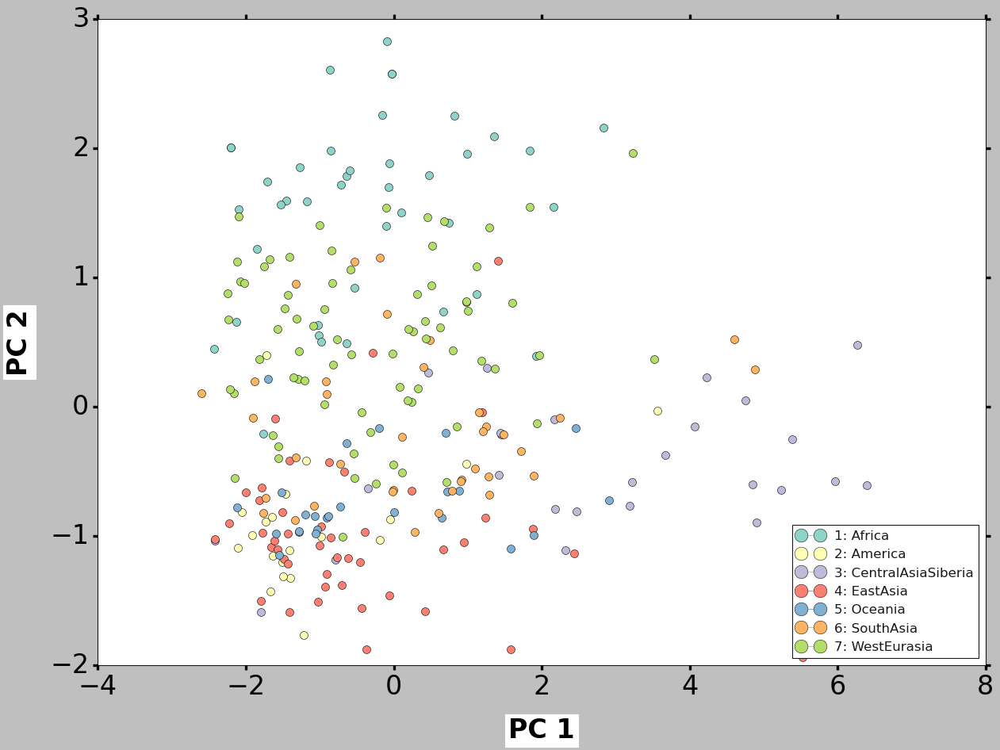

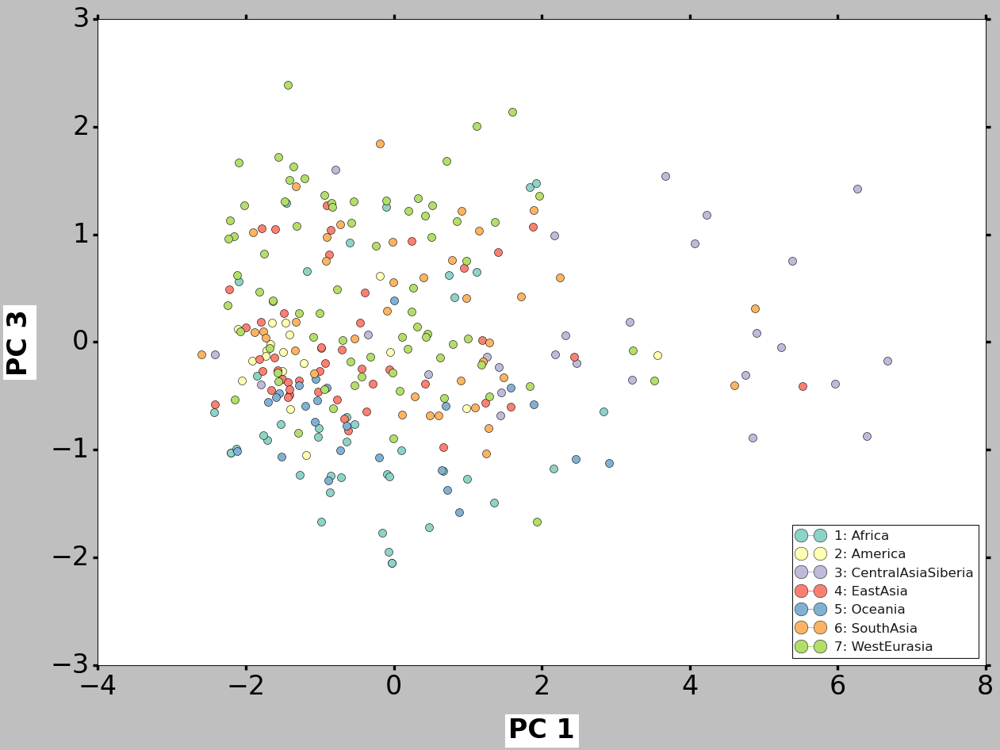

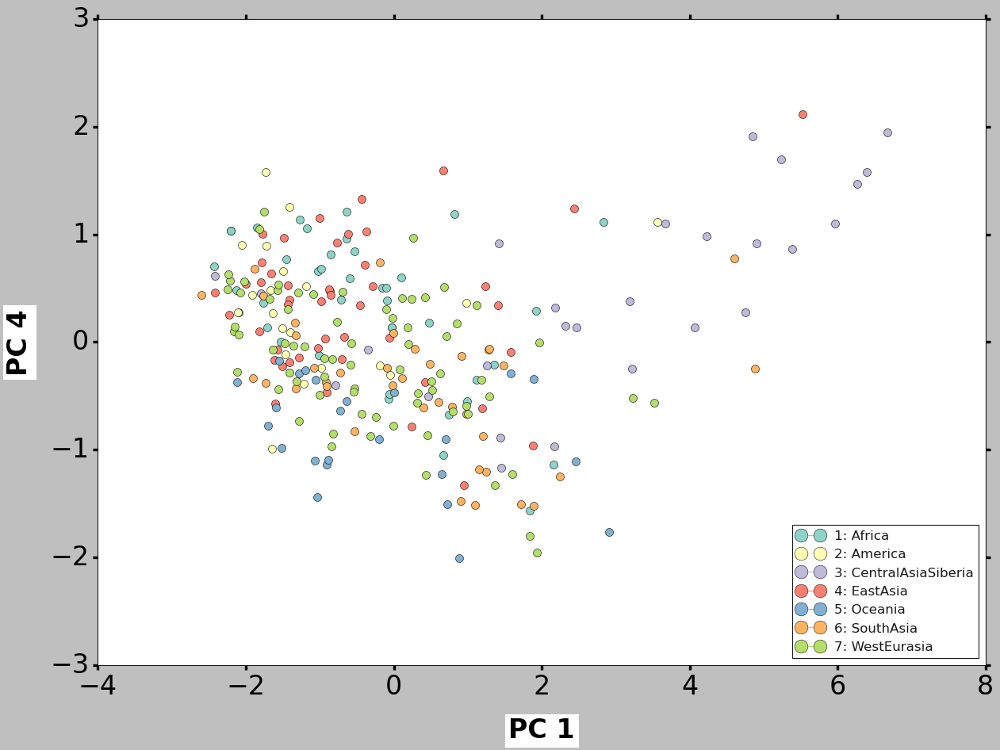

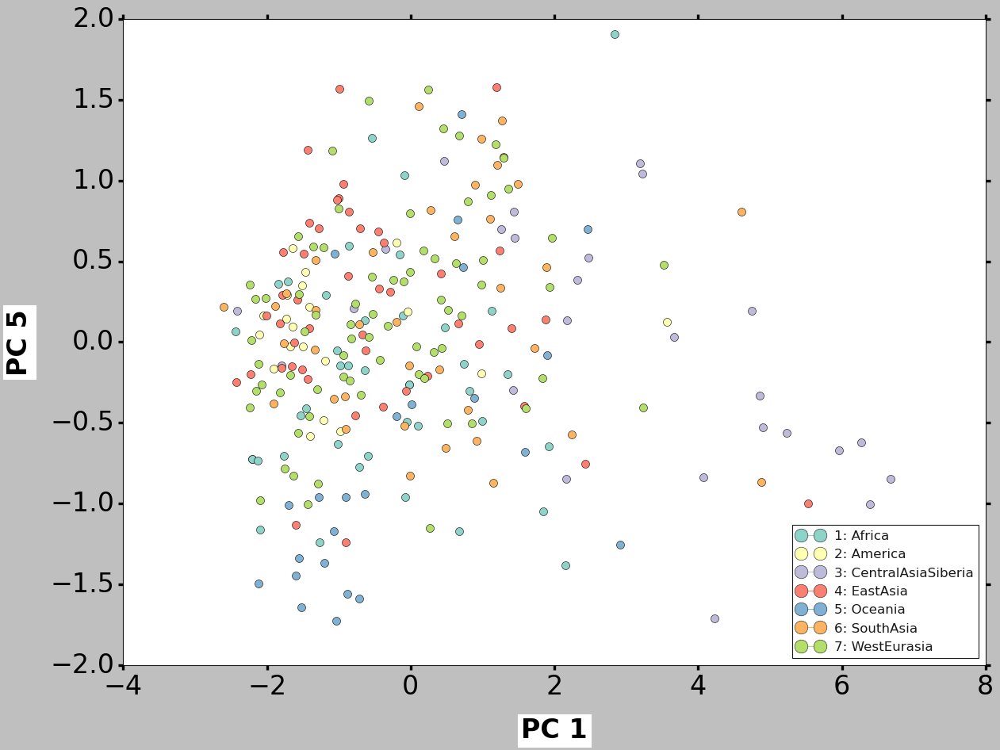

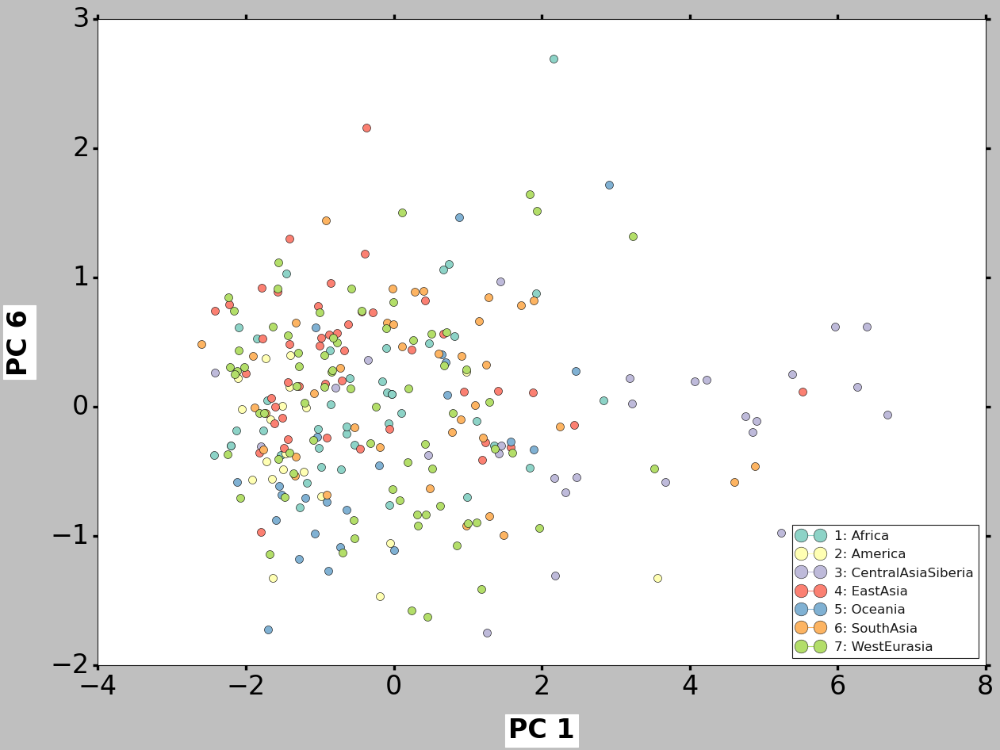

...

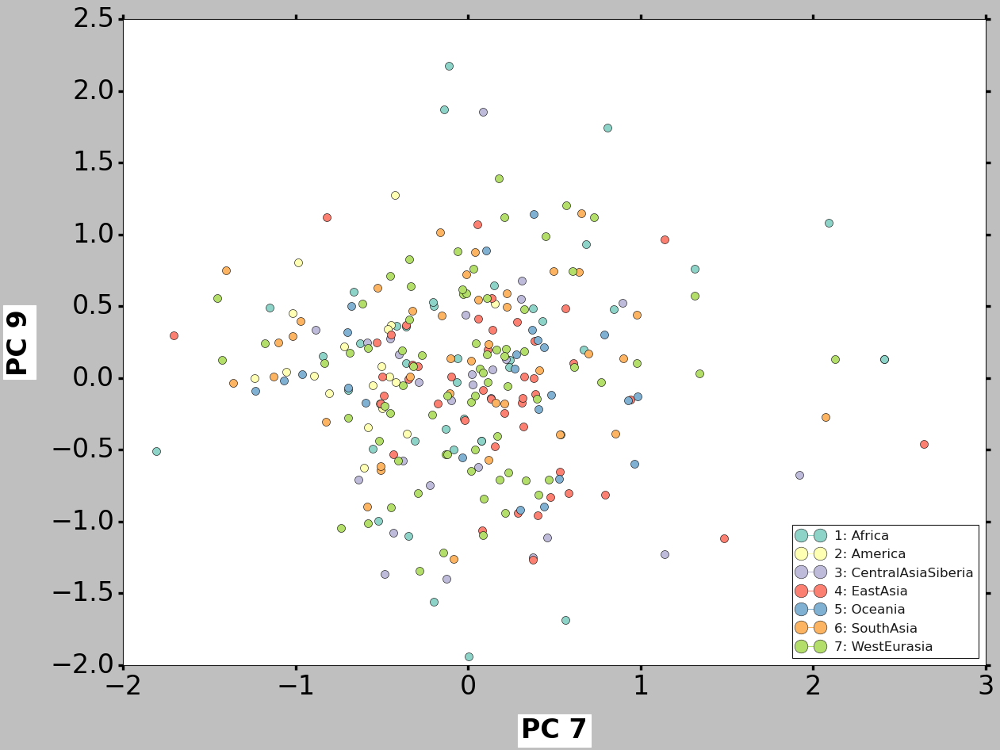

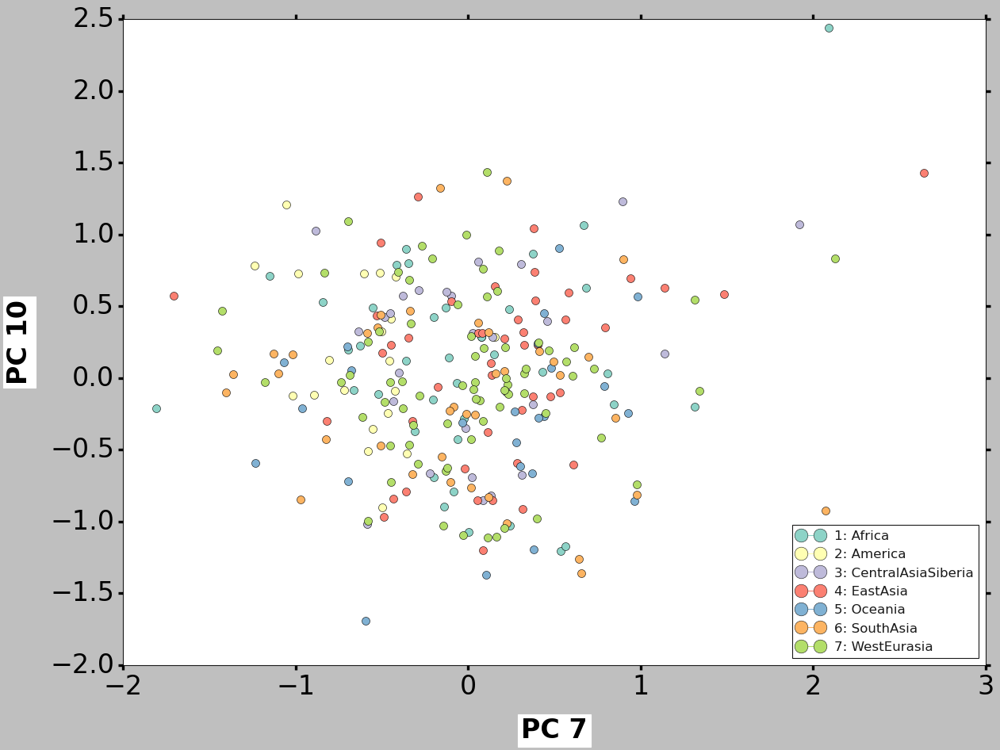

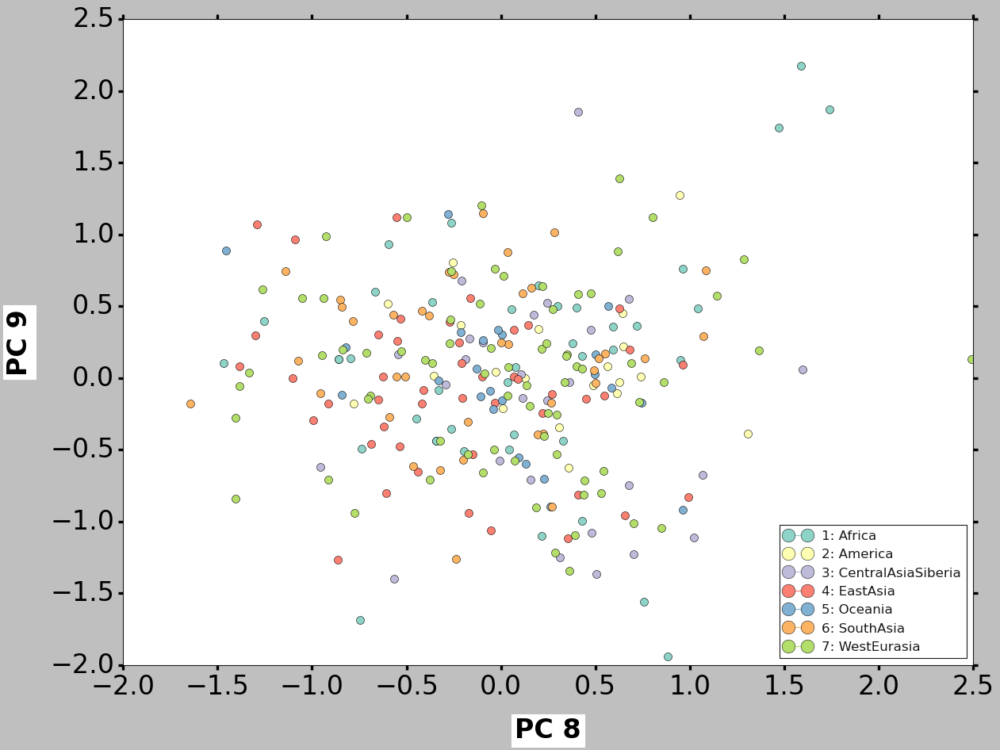

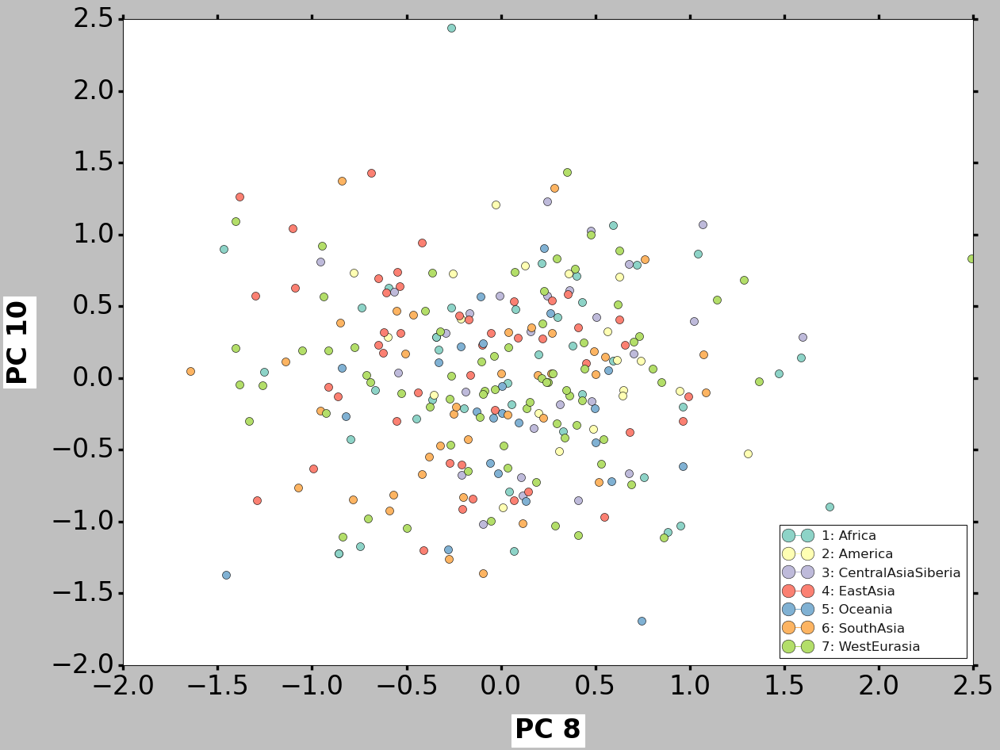

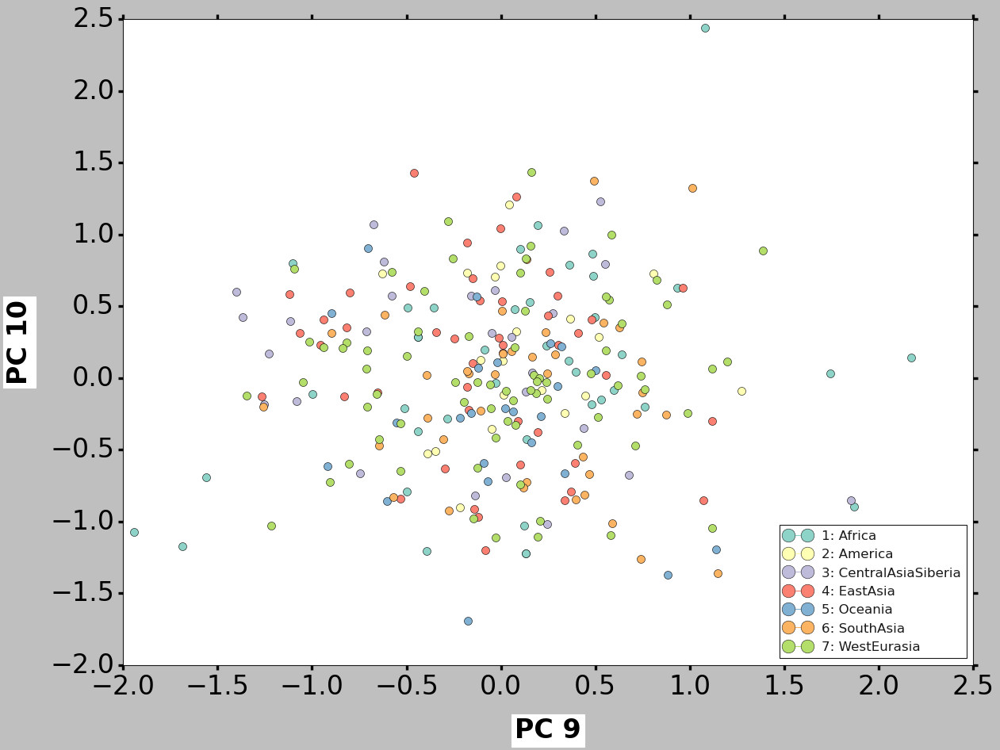

In [118]:
components = [1,2,3,4,5,6,7,8,9,10]

combinations_components = list(combinations(components,2))
for i in combinations_components:
    plot_scatter_cluster(data=df_pca, abscissa='component_'+str(i[0]), ordinate='component_'+str(i[1]), label_horizontal='PC '+ str(i[0]), label_vertical='PC '+str(i[1]), factor='REGION', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))
#    plot_scatter_cluster(data=df_pca, abscissa='component_8', ordinate='component_9', label_horizontal='Component 1', label_vertical='Component 3', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    
    

In [86]:
pca.explained_variance_ratio_

array([0.14509035, 0.045383  , 0.03161188, 0.0246821 , 0.02122604,
       0.02040711, 0.01938775, 0.01831407, 0.01740107, 0.01701927])

                      COUNTRY  component_1  component_2  component_3  \
REGION                                                                 
WestEurasia  Russia(Caucasus)    -0.692083    -1.008009     0.019990   
Oceania        PapuaNewGuinea     0.009318    -0.820516     0.387547   
America              Colombia    -1.637428    -1.154231     0.374721   
WestEurasia            France    -2.076644     0.968004     0.099897   
WestEurasia    Italy(Bergamo)    -2.113683     1.121794     0.624623   
...                       ...          ...          ...          ...   
WestEurasia            Greece     1.933039    -0.132031    -1.669171   
Africa                  Congo     2.155255     1.542929    -1.178222   
Oceania             Australia     2.909981    -0.727506    -1.122546   
Oceania             Australia     0.884783    -0.652427    -1.582489   
Africa                  Sudan     0.673720     0.733411    -1.197715   

             component_4  component_5  component_6  component_7

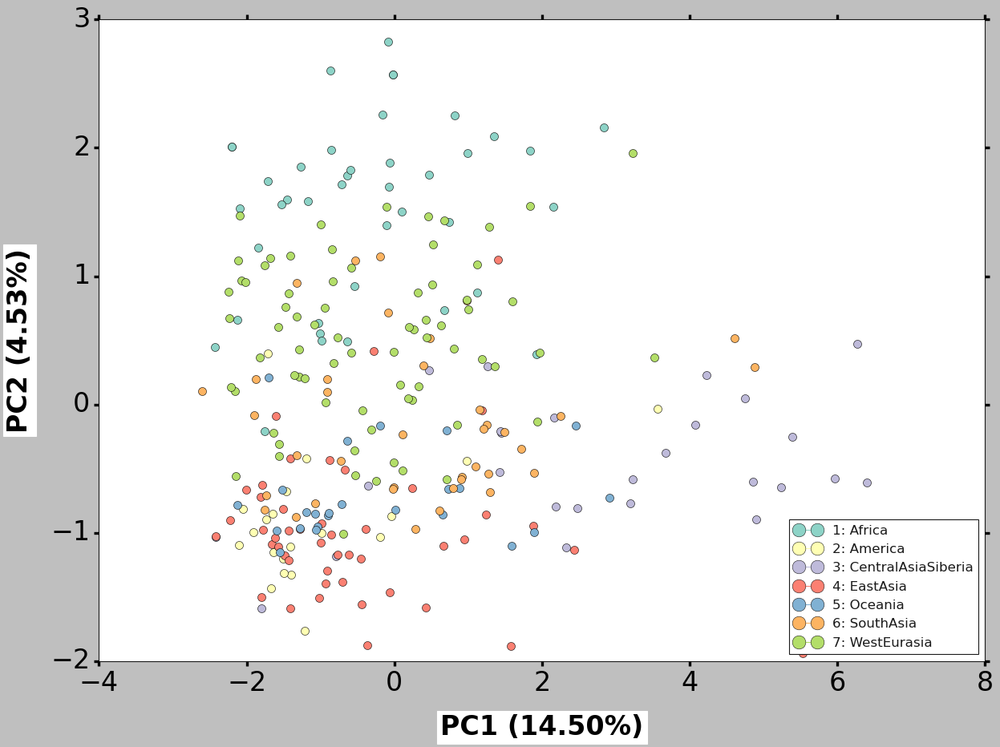

In [89]:
plt.style.use('classic')
plot_scatter_cluster(data=df_pca, abscissa='component_1', ordinate='component_2', label_horizontal='PC1 (14.50%)', label_vertical='PC2 (4.53%)', factor='REGION', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))
#    plot_scatter_cluster(data=df_pca, abscissa='component_8', ordinate='component_9', label_horizontal='Component 1', label_vertical='Component 3', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.savefig('../plots/pca_deletions_pc12_chm13_vst.png', transparent=True)

                      COUNTRY  component_1  component_2  component_3  \
REGION                                                                 
WestEurasia  Russia(Caucasus)    -0.692083    -1.008009     0.019990   
Oceania        PapuaNewGuinea     0.009318    -0.820516     0.387547   
America              Colombia    -1.637428    -1.154231     0.374721   
WestEurasia            France    -2.076644     0.968004     0.099897   
WestEurasia    Italy(Bergamo)    -2.113683     1.121794     0.624623   
...                       ...          ...          ...          ...   
WestEurasia            Greece     1.933039    -0.132031    -1.669171   
Africa                  Congo     2.155255     1.542929    -1.178222   
Oceania             Australia     2.909981    -0.727506    -1.122546   
Oceania             Australia     0.884783    -0.652427    -1.582489   
Africa                  Sudan     0.673720     0.733411    -1.197715   

             component_4  component_5  component_6  component_7

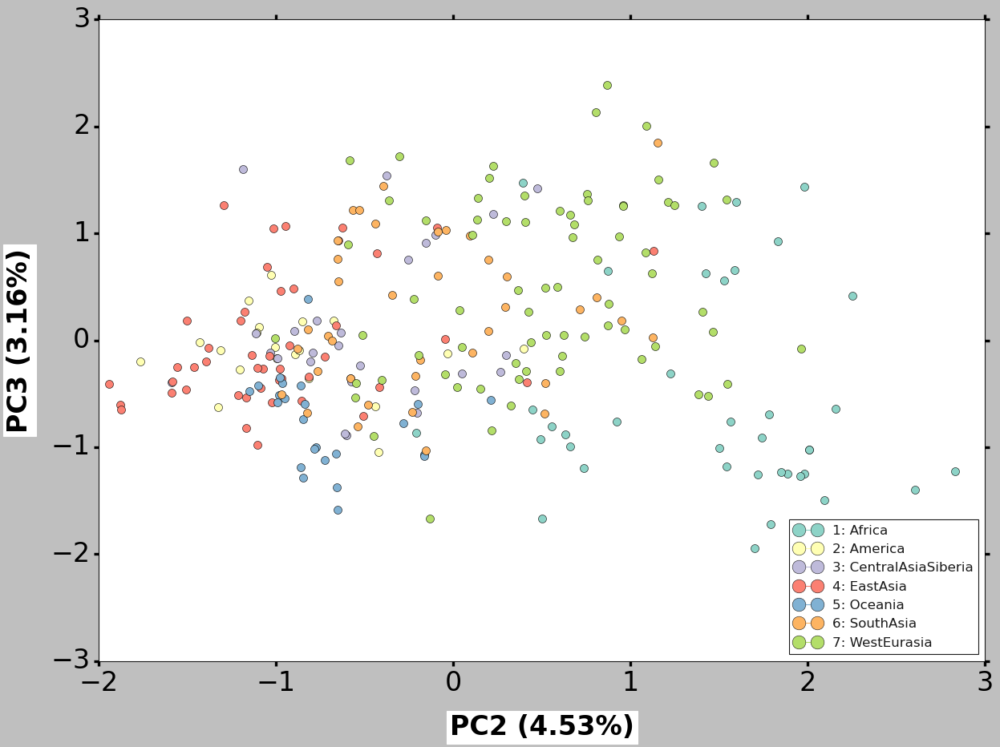

In [90]:
plt.style.use('classic')
plot_scatter_cluster(data=df_pca, abscissa='component_2', ordinate='component_3', label_horizontal='PC2 (4.53%)', label_vertical='PC3 (3.16%)', factor='REGION', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))
#    plot_scatter_cluster(data=df_pca, abscissa='component_8', ordinate='component_9', label_horizontal='Component 1', label_vertical='Component 3', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.savefig('../plots/pca_deletions_pc23_chm13_vst.png', transparent=True)

<h1> Permutation for Vst 
    

In [88]:
p_value_permutation = []

combination_regions = list(combinations([0,1,2,3,4,5,6],2)) 
for region in combination_regions:
    p_value= []
    p_value_permutation.append(p_value)
    
    for i in range(8186):
        permutation = PermutationTest(dt_groupped[region[0]][i], dt_groupped[region[1]][i], stat=vst, n_perm=9999)#mean_gt
        p_value.append(permutation.p_value())
        
        
permutation_vst_chm13_deletions_gene_regions = pd.DataFrame(p_value_permutation).set_axis(combination_names)
#permutation_vst_chm13_deletions_gene_regions.to_csv('permutation_vst_chm13_deletions_gene_regions.csv')
permutation_vst_chm13_deletions_gene_regions



/data/jbazanwilliamson/cnv_sgdp/scripts/vst_function.py:46: RuntimeWarning: invalid value encountered in double_scalars
  vst = (vt-vs)/vt


KeyboardInterrupt: 

In [ ]:
permutation_vst_chm13_deletions_gene_regions = pd.read_csv('permutation_vst_chm13_deletions_gene_regions.csv', index_col='Unnamed: 0')
permutation_vst_chm13_deletions_gene_regions



In [ ]:
boolean = (permutation_vst_chm13_deletions_gene_regions<=0.05)


## Deleting columns where none of the regions passed the imputation
boolean = boolean.loc[:, boolean.any()]
boolean 


In [55]:
boolean.columns = boolean.columns.astype(int)
boolean.columns

Int64Index([   0,    1,    2,    5,    6,    8,    9,   10,   11,   12,
            ...
            8176, 8177, 8178, 8179, 8180, 8181, 8182, 8183, 8184, 8185],
           dtype='int64', length=7438)

In [57]:
# VST with permutation RESULTS 
pd.concat([filtering_vst.T, boolean.T],join='inner', axis=1)


,WestEurasia-Oceania,WestEurasia-America,WestEurasia-Africa,WestEurasia-EastAsia,WestEurasia-SouthAsia,WestEurasia-CentralAsiaSiberia,Oceania-America,Oceania-Africa,Oceania-EastAsia,Oceania-SouthAsia,...,America-Africa,America-EastAsia,America-SouthAsia,America-CentralAsiaSiberia,Africa-EastAsia,Africa-SouthAsia,Africa-CentralAsiaSiberia,EastAsia-SouthAsia,EastAsia-CentralAsiaSiberia,SouthAsia-CentralAsiaSiberia
26,False,False,False,False,False,False,False,False,False,False,...,True,True,False,False,False,False,True,False,True,True
31,False,False,False,False,False,False,False,False,False,False,...,True,False,False,True,False,False,False,False,True,True
61,False,False,False,False,False,True,False,False,False,False,...,False,False,False,True,False,False,True,False,False,True
63,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
81,False,False,False,False,False,False,False,False,False,False,...,False,False,True,True,False,False,True,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8178,False,False,False,False,False,False,False,False,False,False,...,True,False,True,False,False,False,True,True,False,True
8179,False,False,False,False,False,False,False,False,False,False,...,True,False,True,False,False,False,True,True,False,True
8181,False,False,False,False,False,False,False,False,False,False,...,True,False,True,False,False,False,True,True,False,True
8182,False,False,False,False,False,False,False,False,False,False,...,True,False,True,False,False,False,True,True,False,True


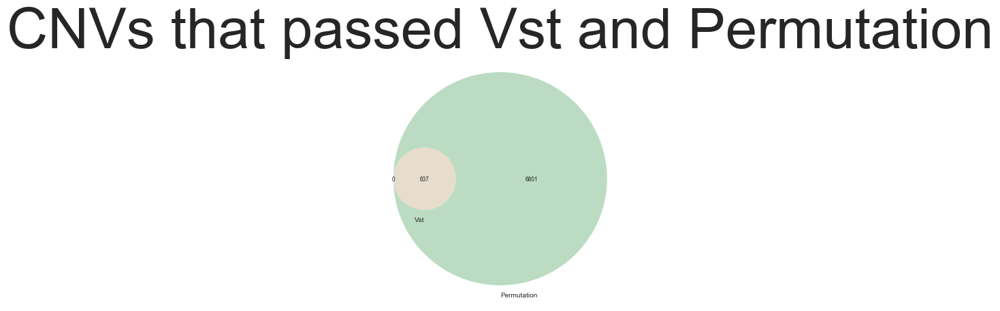

In [58]:
# VST with permutation RESULTS 
inner_vst = len(pd.concat([filtering_vst.T, boolean.T],join='inner', axis=1))
left_vst = len(filtering_vst.T) - inner_vst
right_vst = len(boolean.T) -inner_vst


venn2(subsets = (left_vst, right_vst, inner_vst), set_labels = ('Vst', 'Permutation'))
plt.title('CNVs that passed Vst and Permutation')
plt.show()

<h1> Dmean 

In [11]:
## Dmedian for pair-population
dmean_dt = []

combination_regions = list(combinations([0,1,2,3,4,5,6],2))
for region in combination_regions:
        statistic = dmean((dt_groupped[region[0]]), (dt_groupped[region[1]]))
        dmean_dt.append(statistic)

dmean_dt = pd.DataFrame(dmean_dt).set_axis(combination_names)
#vst_dt = vst_dt.T
dmean_dt

NameError: name 'dmean' is not defined

In [10]:
filtering_dmean = pd.DataFrame(dmean_dt)>=0.5
filtering_dmean = filtering_dmean.loc[:, filtering_dmean.any()]
#filtering_vst = filtering_vst.set_axis(combination_names)
filtering_dmean


NameError: name 'dmean_dt' is not defined

In [61]:
## Coordinates anotation 
dmean_dt = dmean_dt.T
dmean_dt.insert (0, 'chr', cnv['CHR'])
dmean_dt.insert (1, 'start', cnv['START'])
dmean_dt.insert (2, 'end', cnv['END'])
dmean_dt = dmean_dt.round(5)
dmean_dt = dmean_dt.replace(np.NaN, 0)
dmean_dt.to_csv('dmean_hg19_results.csv', index=False)
dmean_dt

,chr,start,end,WestEurasia-Oceania,WestEurasia-America,WestEurasia-Africa,WestEurasia-EastAsia,WestEurasia-SouthAsia,WestEurasia-CentralAsiaSiberia,Oceania-America,...,America-Africa,America-EastAsia,America-SouthAsia,America-CentralAsiaSiberia,Africa-EastAsia,Africa-SouthAsia,Africa-CentralAsiaSiberia,EastAsia-SouthAsia,EastAsia-CentralAsiaSiberia,SouthAsia-CentralAsiaSiberia
0,chr1,102061,111943,0.19692,0.02192,0.11460,0.00417,0.02019,0.11821,0.17500,...,0.09268,0.02609,0.04211,0.09630,0.11877,0.13479,0.00361,0.01602,0.12238,0.13840
1,chr1,521722,540598,0.02740,0.07260,0.07016,0.02740,0.02523,0.04668,0.10000,...,0.00244,0.10000,0.04737,0.02593,0.09756,0.04493,0.02349,0.05263,0.07407,0.02144
2,chr1,613436,625116,0.14897,0.02603,0.03007,0.07832,0.14708,0.13343,0.17500,...,0.05610,0.10435,0.12105,0.10741,0.04825,0.17715,0.16350,0.22540,0.21176,0.01365
3,chr1,839350,851555,0.07192,0.07808,0.04143,0.02591,0.13771,0.11821,0.15000,...,0.11951,0.05217,0.21579,0.19630,0.06734,0.09628,0.07678,0.16362,0.14412,0.01949
4,chr1,1041679,1050074,0.09532,0.06301,0.03943,0.01519,0.00541,0.02588,0.15833,...,0.10244,0.04783,0.06842,0.08889,0.05461,0.03402,0.01355,0.02059,0.04106,0.02047
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8182,chr6,65384421,65392649,0.06507,0.61507,0.05079,0.18463,0.26388,0.50025,0.55000,...,0.66585,0.43043,0.87895,0.11481,0.23542,0.21309,0.55104,0.44851,0.31562,0.76413
8183,chr6,65441699,65459644,0.06507,0.61507,0.05079,0.18463,0.26388,0.50025,0.55000,...,0.66585,0.43043,0.87895,0.11481,0.23542,0.21309,0.55104,0.44851,0.31562,0.76413
8184,chr6,65476242,65501620,0.01370,0.01370,0.01370,0.00804,0.01370,0.01370,0.00000,...,0.00000,0.02174,0.00000,0.00000,0.02174,0.00000,0.00000,0.02174,0.02174,0.00000
8185,chr6,65521175,65530231,0.01370,0.01370,0.01370,0.00804,0.01262,0.01370,0.00000,...,0.00000,0.02174,0.02632,0.00000,0.02174,0.02632,0.00000,0.00458,0.02174,0.02632


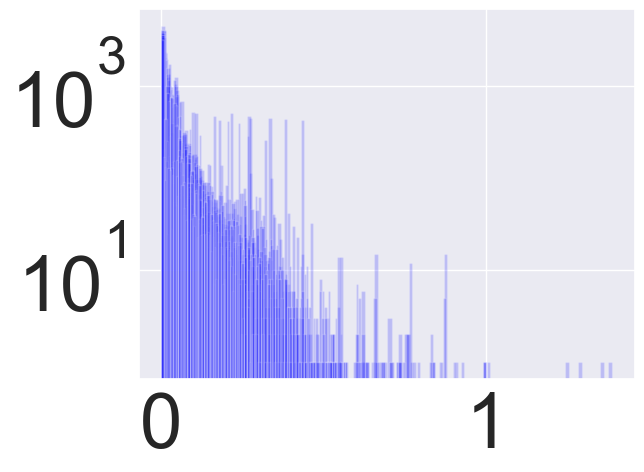

In [62]:
#sns.set_palette("bright")
for i in dmean_dt.iloc[:,3:25].columns:
    plt.hist(dmean_dt[i], bins=100, alpha=0.2, log=True, color="blue")

In [63]:
# PERMUTATION 


In [66]:
p_value_permutation = []

combination_regions = list(combinations([0,1,2,3,4,5,6],2))
for region in combination_regions:
    
    p_value= []
    p_value_permutation.append(p_value)
    for i in range(8187):
        permutation = PermutationTest(dt_groupped[region[0]][i], dt_groupped[region[1]][i], stat=dmean, n_perm=9999)
        p_value.append(permutation.p_value())

names = []
regions = dt['REGION'].unique()
for i in list(combinations(regions,2)):
    names.append(i[0]+str('-')+i[1])

In [67]:
#Saving the permutation results 
results_permutation = pd.DataFrame(p_value_permutation).set_index(np.array(names))
#results_permutation.to_csv('dmean_permutation_results_chm13_deletions_gene_regions.csv')

In [71]:
results_permutation = pd.read_csv('dmean_permutation_results_chm13_deletions_gene_regions.csv', index_col=0)
results_permutation

,0,1,2,3,4,5,6,7,8,9,...,8177,8178,8179,8180,8181,8182,8183,8184,8185,8186
WestEurasia-Oceania,0.0569,1.0000,0.1709,0.5535,0.2862,1.0000,1.0000,1.0000,1.0000,0.2528,...,1.0000,0.8094,1.0000,1.0000,1.0000,0.8122,0.8114,1.0,1.0000,1.0000
WestEurasia-America,1.0000,0.2019,1.0000,0.5188,0.7224,1.0000,1.0000,0.5817,0.2843,1.0000,...,0.0388,0.0214,0.0296,0.0390,0.0331,0.0213,0.0190,1.0,1.0000,1.0000
WestEurasia-Africa,0.1688,0.1847,0.8224,0.6292,0.5696,1.0000,0.1249,1.0000,1.0000,0.6174,...,0.5305,0.8492,0.5318,0.5874,0.5953,0.8402,0.8365,1.0,1.0000,0.5355
WestEurasia-EastAsia,1.0000,0.5177,0.3884,0.8032,1.0000,1.0000,0.3886,0.3031,0.3095,1.0000,...,0.4247,0.3373,0.3871,0.2328,0.3702,0.3347,0.3404,1.0,1.0000,1.0000
WestEurasia-SouthAsia,0.7975,0.6062,0.1409,0.1492,1.0000,0.1136,0.3465,0.4399,0.0474,0.5548,...,0.0596,0.1954,0.0811,0.1490,0.0919,0.1936,0.1880,1.0,1.0000,1.0000
WestEurasia-CentralAsiaSiberia,0.2709,0.5772,0.2229,0.2693,0.7607,1.0000,1.0000,0.3833,0.4849,0.6087,...,0.0178,0.0375,0.0151,0.0088,0.0113,0.0389,0.0372,1.0,1.0000,0.5997
Oceania-America,0.3220,0.2070,0.2569,0.2582,0.1606,1.0000,1.0000,1.0000,0.3317,0.5025,...,0.0998,0.1290,0.1276,0.1176,0.1293,0.1270,0.1329,1.0,1.0000,1.0000
Oceania-Africa,0.5827,0.2859,0.3369,1.0000,0.6433,1.0000,0.5228,1.0000,0.7989,0.6278,...,0.5872,0.7845,0.7843,0.6787,0.7898,0.7827,0.7875,1.0,1.0000,1.0000
Oceania-EastAsia,0.0840,1.0000,0.5152,0.3522,0.2510,1.0000,1.0000,0.4114,0.4106,0.6049,...,0.7027,0.7908,0.5272,0.4468,0.5361,0.8056,0.8018,1.0,1.0000,1.0000
Oceania-SouthAsia,0.0653,0.5090,0.0239,0.7671,0.3925,0.5188,1.0000,0.6246,0.0701,0.1463,...,0.1496,0.2429,0.2343,0.2453,0.2421,0.2428,0.2414,1.0,1.0000,1.0000


In [73]:
dmean_boolean = (results_permutation<=0.05)

dmean_boolean.columns = dmean_boolean.columns.astype(int) 

## Deleting columns where none of the regions passed the imputation
dmean_boolean = dmean_boolean.loc[:, dmean_boolean.any()]
dmean_boolean 

,1,2,8,14,15,16,20,22,26,31,...,8174,8175,8176,8177,8178,8179,8180,8181,8182,8183
WestEurasia-Oceania,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
WestEurasia-America,False,False,False,False,False,False,False,False,True,False,...,True,True,False,True,True,True,True,True,True,True
WestEurasia-Africa,False,False,False,True,False,False,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False
WestEurasia-EastAsia,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
WestEurasia-SouthAsia,False,False,True,False,False,False,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False
WestEurasia-CentralAsiaSiberia,False,False,False,False,False,True,True,False,True,True,...,True,True,True,True,True,True,True,True,True,True
Oceania-America,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Oceania-Africa,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Oceania-EastAsia,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Oceania-SouthAsia,False,True,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


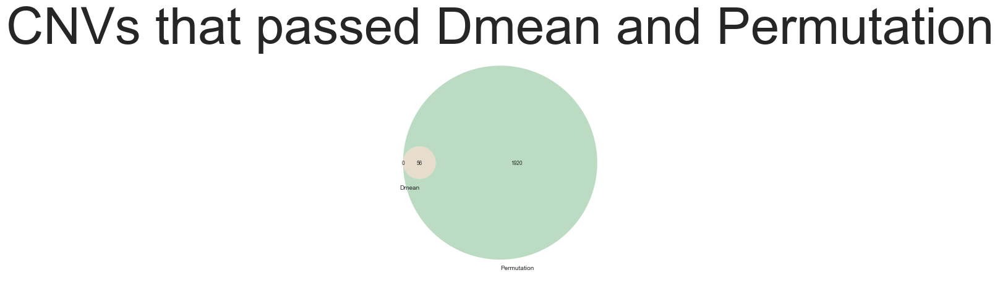

In [74]:
# DMEAN RESULTS 
inner_vst = len(pd.concat([filtering_dmean.T, dmean_boolean.T],join='inner', axis=1))
left_vst = len(filtering_dmean.T) - inner_vst
right_vst = len(dmean_boolean.T) -inner_vst


venn2(subsets = (left_vst, right_vst, inner_vst), set_labels = ('Dmean', 'Permutation'))
plt.title('CNVs that passed Dmean and Permutation')
plt.show()

In [29]:
import multiprocessing

In [30]:
def cube(x):
    return x**3
 
if __name__ == "__main__":
    # this does not work
    processes = [multiprocessing.Process(target=cube, args=(x,)) for x in range(1,10)]
    [p.start() for p in processes]
    result = [p.join() for p in processes]
    print(result)

Traceback (most recent call last):
  File "<string>", line 1, in <module>
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/spawn.py", line 116, in spawn_main
    exitcode = _main(fd, parent_sentinel)
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/spawn.py", line 126, in _main
    self = reduction.pickle.load(from_parent)
AttributeError: Can't get attribute 'cube' on <module '__main__' (built-in)>
Traceback (most recent call last):
  File "<string>", line 1, in <module>
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/spawn.py", line 116, in spawn_main
    exitcode = _main(fd, parent_sentinel)
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/spawn.py", line 126, in _main
    self = reduction.pickle.load(from_parent)
AttributeError: Can't get attribute 'cube' on <module '__main__' (built-in)>
Traceback (most recent call last):
  File "<string>", line 1, in <module>
  File "/Users/luciabazan/opt/anaconda

[None, None, None, None, None, None, None, None, None]


Traceback (most recent call last):
  File "<string>", line 1, in <module>
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/spawn.py", line 116, in spawn_main
    exitcode = _main(fd, parent_sentinel)
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/spawn.py", line 126, in _main
    self = reduction.pickle.load(from_parent)
AttributeError: Can't get attribute 'cube' on <module '__main__' (built-in)>
Traceback (most recent call last):
  File "<string>", line 1, in <module>
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/spawn.py", line 116, in spawn_main
    exitcode = _main(fd, parent_sentinel)
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/spawn.py", line 126, in _main
    self = reduction.pickle.load(from_parent)
AttributeError: Can't get attribute 'cube' on <module '__main__' (built-in)>
Traceback (most recent call last):
  File "<string>", line 1, in <module>
  File "/Users/luciabazan/opt/anaconda

In [40]:
processes = [multiprocessing.Process(target=permutation, args=(x,)) for x in range(23)]
[p.start() for p in processes]
result = [p.join() for p in processes]
print(result)

Process Process-109:
Traceback (most recent call last):
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/process.py", line 315, in _bootstrap
    self.run()
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/vst_function.py", line 79, in permutation
    for i in lenght_cnvs:
TypeError: 'int' object is not iterable
Process Process-113:
Traceback (most recent call last):
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/process.py", line 315, in _bootstrap
    self.run()
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/vst_function.py", line 79, in permutation
    for i in lenght_cnvs:
TypeError: 'int' object is not iterable
Process Process-

[None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None]


  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/process.py", line 315, in _bootstrap
    self.run()
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/vst_function.py", line 79, in permutation
    for i in lenght_cnvs:
TypeError: 'int' object is not iterable
Process Process-111:
Traceback (most recent call last):
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/process.py", line 315, in _bootstrap
    self.run()
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/vst_function.py", line 79, in permutation
    for i in lenght_cnvs:
TypeError: 'int' object is not iterable
Process Process-110:
Traceback (most recent call last):
  File "/Users/l

In [36]:
import vst_function

In [37]:
vst_function.permutation

<function vst_function.permutation(lenght_cnvs)>

In [1]:
import permutation_chm13
permutation_chm13.permutation_chm13(range(5))

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/vst_function.py:47: RuntimeWarning: invalid value encountered in double_scalars
  vst = (vt-vs)/vt


,0,1,2,3,4
WestEurasia-Oceania,0.3772,0.0333,0.0001,0.8111,0.1204
WestEurasia-America,0.1834,0.9141,0.0001,0.1462,0.9666
WestEurasia-Africa,0.0007,0.1441,0.0001,0.0530,0.7894
WestEurasia-EastAsia,0.0181,0.9989,0.2712,0.6117,0.2933
WestEurasia-SouthAsia,0.0004,0.7641,0.0001,0.4816,0.1338
WestEurasia-CentralAsiaSiberia,0.0563,0.2084,0.0001,0.2699,0.2331
Oceania-America,0.6582,0.3166,0.0001,0.1451,0.2643
Oceania-Africa,0.0009,0.5866,0.0001,0.2228,0.3354
Oceania-EastAsia,0.3643,0.0674,0.8030,0.0001,0.5140
Oceania-SouthAsia,0.0193,0.0705,0.0001,0.3938,0.0220


In [11]:
pool = multiprocessing.Pool() 
jobs = [] 
for j in range(10):
    p = multiprocessing.Process(target = permutation_chm13.permutation_chm13(range(5)))
    jobs.append(p)
    p.start() 
    


/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/vst_function.py:47: RuntimeWarning: invalid value encountered in double_scalars
  vst = (vt-vs)/vt
Process Process-50:
Traceback (most recent call last):
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/process.py", line 315, in _bootstrap
    self.run()
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/process.py", line 107, in run
    if self._target:
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/site-packages/pandas/core/generic.py", line 1527, in __nonzero__
    raise ValueError(
ValueError: The truth value of a DataFrame is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/vst_function.py:47: RuntimeWarning: invalid value encountered in double_scalars
  vst = (vt-vs)/vt
Process Process-51:
Traceback (most recent call last):
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/process.py", line 315, i